# What properties of a song define its style/genre?

**Names**: Dev Langaliya, Eric Hartman, Sandra Mei


## 1. Introduction

Music streaming platforms, such as Spotify, host millions of tracks with diverse audio characteristics, yet listeners often struggle to discover songs that match their preferred vibe or style. Understanding the inherent clusters in a dataset of audio features can reveal natural groupings of songs that share similar qualities which may not correspond exactly to genre labels. This insight is valuable for designing more personalized and intuitive music recommendation systems (Schedl et al., 2015) which leverage content-based audio features to improve recommendation relevance beyond simple metadata. The motivation of this analysis is to explore songs characteristics, identify clusters, and determine whether shared audio features can inform recommendations based on vibe, style, or genre alignment.

A potential user of this analysis is someone working on a music recommendation product. By identifying clusters of songs with similar audio features, they could create recommendation systems that suggest tracks with similar vibes and styles rather than relying solely on categorical metadata like artist or album. This person could recommend tracks from the same cluster when a listener plays a song, ensuring that the recommendation captures nuanced characteristics like mood, tempo, and energy. Next steps for this user would include integrating cluster memberships into collaborative filtering algorithms or playlist-generation pipelines, and analyzing whether clusters correspond with genre to inform playlist curation, cross-genre recommendations, or personalized discovery experiences.

However, clustering errors can affect the interpretation of the dataset itself. If a clustering algorithm fails to detect all inherent clusters, some meaningful groupings of songs based on shared audio characteristics may be overlooked, reducing our ability to understand the true structure of the musical feature space. On the other hand, if an algorithm erroneously splits a true cluster, songs that naturally belong together in the feature space may be separated, giving a distorted view of the relationships between tracks and potentially exaggerating song differences that actually are not meaningful. These types of errors can lead to incorrect conclusions about the patterns present in the dataset.

Different types of clustering outputs can support these goals. Hard partitions, such as those produced by k-means or Hierarchical Agglomerative Clustering provide clear groupings. This would be helpful if trying to build a recommendation system or direct playlist for example. Fuzzy clustering, such as Gaussian Mixture Model's probabilistic assignments, captures overlapping memberships, reflecting tracks that share characteristics across multiple clusters. This allows a song to be compared in style to multiple cluster groups, not just assigned to one, which is helpful with the diversity of music styles and genres.

The remainder of this report is structured as follows:

2. Dataset Discussion: Description of the Spotify dataset, its features, and initial observations.
3. Dataset Cleaning and Exploration: Handling missing values, encoding categorical variables, and identifying outliers.
4. Basic Descriptive Analytics: Summary statistics and relationships among variables.
5. Dataset Scaling: Standardizing numerical features for clustering.
6. Clusterability and t-SNE analysis: Assessing inherent cluster structure using t-SNE visualizations.
7. Clustering Algorithm 1 - Gaussian Mixture Models: Applying GMM and interpreting resulting clusters.
8. Clustering Algorithm 2 - HAC with Wards and Complete Linkages: Applying hierarchical clustering and interpreting resulting clusters
9. Discussion of Analysis: Comparing clustering results, evaluating cluster quality, separation, sparsity, and identifying insights unique to each algorithm.
10. Conclusion: Summarizing key findings, implications for music analysis and recommendations, and potential next steps for future research.


## 2. Dataset Discussion

In [ ]:
# determine if running in colab or in personal IDE
try:
  from google.colab import drive
  IN_COLAB = True
except:
  IN_COLAB = False

# Library
import pandas as pd
import numpy as np
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
#from sklearn import preprocessing
#from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, adjusted_rand_score

In [ ]:
# if you are running in google colab, will mount drive and download data
if IN_COLAB:
  drive.mount('/content/drive')
  data_path = '/content/drive/MyDrive/Stat 437 Project/low_popularity_spotify_data.csv'
else:
   data_path = '/Users/ericjh/Library/CloudStorage/GoogleDrive-eh14@illinois.edu/My Drive/Stat 437 Project/low_popularity_spotify_data.csv'
   #csv_path = '<ENTER YOUR CSV PATH HERE>'

In [ ]:
# download spotify data
df = pd.read_csv(data_path)

# display head
pd.set_option('display.max_columns', None)
df.head()

,time_signature,track_popularity,speechiness,danceability,playlist_name,track_artist,duration_ms,energy,playlist_genre,playlist_subgenre,track_href,track_name,mode,uri,type,track_album_release_date,analysis_url,id,instrumentalness,track_album_id,playlist_id,track_id,valence,key,tempo,loudness,acousticness,liveness,track_album_name
0,4.0,23,0.0393,0.636,Rock Classics,Creedence Clearwater Revival,138053.0,0.746,rock,classic,https://api.spotify.com/v1/tracks/5e6x5YRnMJIK...,Fortunate Son,1.0,spotify:track:5e6x5YRnMJIKvYpZxLqdpH,audio_features,2005-12-14,https://api.spotify.com/v1/audio-analysis/5e6x...,5e6x5YRnMJIKvYpZxLqdpH,0.290000,4A8gFwqd9jTtnsNwUu3OQx,37i9dQZF1DWXRqgorJj26U,5e6x5YRnMJIKvYpZxLqdpH,0.432,0.0,132.310,-3.785,0.0648,0.1730,The Long Road Home - The Ultimate John Fogerty...
1,4.0,53,0.0317,0.572,Rock Classics,Van Halen,241600.0,0.835,rock,classic,https://api.spotify.com/v1/tracks/5FqYA8KfiwsQ...,Jump - 2015 Remaster,1.0,spotify:track:5FqYA8KfiwsQvyBI4IamnY,audio_features,2015-03-27,https://api.spotify.com/v1/audio-analysis/5FqY...,5FqYA8KfiwsQvyBI4IamnY,0.000377,2c965LEDRNrXXCeBOAAwns,37i9dQZF1DWXRqgorJj26U,5FqYA8KfiwsQvyBI4IamnY,0.795,0.0,129.981,-6.219,0.1710,0.0702,The Collection
2,4.0,55,0.0454,0.591,Rock Classics,Stevie Nicks,329413.0,0.804,rock,classic,https://api.spotify.com/v1/tracks/5LNiqEqpDc8T...,Edge of Seventeen - 2016 Remaster,1.0,spotify:track:5LNiqEqpDc8TuqPy79kDBu,audio_features,2016-11-04,https://api.spotify.com/v1/audio-analysis/5LNi...,5LNiqEqpDc8TuqPy79kDBu,0.000006,3S404OgKoVQSJ3xXrDVlp8,37i9dQZF1DWXRqgorJj26U,5LNiqEqpDc8TuqPy79kDBu,0.658,0.0,111.457,-7.299,0.3270,0.0818,Bella Donna (Deluxe Edition)
3,4.0,64,0.1010,0.443,Jazz Classics,"Ella Fitzgerald, Louis Armstrong",185160.0,0.104,jazz,classic,https://api.spotify.com/v1/tracks/78MI7mu1LV1k...,Dream A Little Dream Of Me - Single Version,1.0,spotify:track:78MI7mu1LV1k4IA2HzKmHe,audio_features,2007-05-03,https://api.spotify.com/v1/audio-analysis/78MI...,78MI7mu1LV1k4IA2HzKmHe,0.000000,1y5KGkUKO0NG32MhIIagCA,37i9dQZF1DXbITWG1ZJKYt,78MI7mu1LV1k4IA2HzKmHe,0.394,0.0,76.474,-17.042,0.9130,0.1910,"Love, Ella"
4,4.0,62,0.0298,0.685,Jazz Classics,Galt MacDermot,205720.0,0.472,jazz,classic,https://api.spotify.com/v1/tracks/6MN6yRVriszu...,Coffee Cold,0.0,spotify:track:6MN6yRVriszuyAVlyF8ndB,audio_features,2000-01-01,https://api.spotify.com/v1/audio-analysis/6MN6...,6MN6yRVriszuyAVlyF8ndB,0.284000,6f4b9wVTkKAf096k4XG6x5,37i9dQZF1DXbITWG1ZJKYt,6MN6yRVriszuyAVlyF8ndB,0.475,9.0,80.487,-9.691,0.7850,0.2240,Shapes of Rhythm/Woman Is Sweeter


In [ ]:
# display all columns
print(df.columns)
print(df.shape)

Index(['time_signature', 'track_popularity', 'speechiness', 'danceability',
       'playlist_name', 'track_artist', 'duration_ms', 'energy',
       'playlist_genre', 'playlist_subgenre', 'track_href', 'track_name',
       'mode', 'uri', 'type', 'track_album_release_date', 'analysis_url', 'id',
       'instrumentalness', 'track_album_id', 'playlist_id', 'track_id',
       'valence', 'key', 'tempo', 'loudness', 'acousticness', 'liveness',
       'track_album_name'],
      dtype='object')
(3145, 29)


The dataset was obtained from Kaggle, specifically from the Spotify Music Dataset published by Solomon Ameh. The dataset is publicly available at the following link: https://www.kaggle.com/datasets/solomonameh/spotify-music-dataset .

The data was downloaded on January 7, 2025. According to the dataset documentation, the songs were collected using Spotify's public Web API through two separate Python scripts. These scripts were designed to extract both popular and non-popular tracks, along with their associated metadata and audio features. Spotify's API provides two primary types of info for each song. Descriptive features include metadata such as the artist's name, album title, release date, and playlist categorization. Audio features are generated by Spotify's internal audio analysis system and include quantitative measures like energy, danceability, and valence.

Each row in the dataset represents a single Spotify track. Prior to any data cleaning, the original dataset contained `3145` observations. As a result, the dataset is not inclusive of all possible musical recordings, but rather should be interpreted as a sample of those available on Spotify, rather than a comprehensive representation of all music. Furthermore, songs that are not available on Spotify, so tracks that lack sufficient metadata, or music from underrepresented regions, may be excluded from this dataset. It is also beyond this project's scope to run a clustering analysis on all available tracks on Spotify. So, this dataset leaves out plenty of songs that exist on Spotify, and recordings on some other platform/service.

This analysis focuses primarily on Spotify's numerical audio features, as these variables directly capture measurable musical characteristics and are well-suited for unsupervised clustering methods. The numerical attributes used in this study include:

* `energy`: A measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy
* `tempo`: The speed of a track, measured in beats per minute (BPM).
* `danceability`: A score describing how suitable a track is for dancing based on tempo, rhythm stability, beat strength and overall regularity.
* `loudness`: The overall loudness of a track in decibels (dB). Higher values indicate louder tracks overall.
* `liveness`: The likelihood of a track being performed live. Higher values suggest more audience presence.
* `valence`: The overall musical positiveness(emotion) of a track. High valence sounds happy; low valence sounds sad or angry.
* `speechiness`:  Measures the presence of spoken words.
* `acousticness`:The likelihood a track contains no vocals. Values closer to 1.0 suggest solely instrumental tracks.

These variables were selected because they collectively describe how a song feels to the listener, which aligns with our research motivation of identifying meaningful music clusters for recommendation based on listener vibe and genre preferences. Rather than relying on explicit genre labels, these audio features capture perceptual qualities such as mood, intensity, and rhythm, all which can strongly influence how listeners categorize and engage with music.

In this analysis, all selected variables were treated as equally important during the clustering process. This design choice aligns with the exploratory nature of the study. By assigning equal importance to each feature, this analysis avoids introducing subjective bias regarding which musical characteristics should dominate the clustering structure. While certain features, such as energy or danceability, may ultimately prove more influential in defining clusters, allowing the algorithm to determine these relationships organically provides a more data-driven foundation for our insights into music recommendations.


## 3. Dataset Cleaning and Exploration

In [ ]:
#check if any null values
print(df.isnull().sum())

# drop null values
df = df.dropna()

time_signature              1
track_popularity            0
speechiness                 1
danceability                1
playlist_name               0
track_artist                0
duration_ms                 1
energy                      1
playlist_genre              0
playlist_subgenre           0
track_href                  1
track_name                  0
mode                        1
uri                         1
type                        1
track_album_release_date    0
analysis_url                1
id                          1
instrumentalness            1
track_album_id              0
playlist_id                 0
track_id                    0
valence                     1
key                         1
tempo                       1
loudness                    1
acousticness                1
liveness                    1
track_album_name            0
dtype: int64


In [ ]:
# change `key` from number encoding to string of what key it is
key_mapping = {0 : 'C', 1 : 'C#', 2 : 'D', 3 : 'D#', 4 : 'E', 5 : 'F', 6 : 'F#', 7 : 'G', 8 : 'G#', 9 : 'A', 10 : 'A#', 11 : 'B'}
df['key'] = df['key'].map(key_mapping)

# mode: num -> categorical
mode_mapping = {1 : 'Major', 0: 'Minor'}
df['mode'] = df['mode'].map(mode_mapping)

# time_signature: num -> categorical
time_signature_mapping = {1 : '1/4', 3: '3/4', 4 : '4/4', 5: '5/4'}
df['time_signature'] = df['time_signature'].map(time_signature_mapping)

# only looking at conventional music genres
df = df[df["playlist_genre"].isin(["classical", "hip-hop", "rock", "jazz"])]
print(df.shape)

(534, 29)


In [ ]:
# get numerical columns and categorical columns and datasets
cols_num = ['energy', 'tempo', 'danceability', 'loudness', 'liveness', 'valence', 'speechiness', 'acousticness']
cols_cat = ['playlist_genre', 'time_signature', 'key', 'mode']

# create numerical and categorical X
X_numerical = df[cols_num]
X_categorical = df[cols_cat]

# create X to cluster on
X = df[cols_cat + cols_num]

X_numerical.head()

,energy,tempo,danceability,loudness,liveness,valence,speechiness,acousticness
0,0.746,132.310,0.636,-3.785,0.1730,0.432,0.0393,0.0648
1,0.835,129.981,0.572,-6.219,0.0702,0.795,0.0317,0.1710
2,0.804,111.457,0.591,-7.299,0.0818,0.658,0.0454,0.3270
3,0.104,76.474,0.443,-17.042,0.1910,0.394,0.1010,0.9130
4,0.472,80.487,0.685,-9.691,0.2240,0.475,0.0298,0.7850


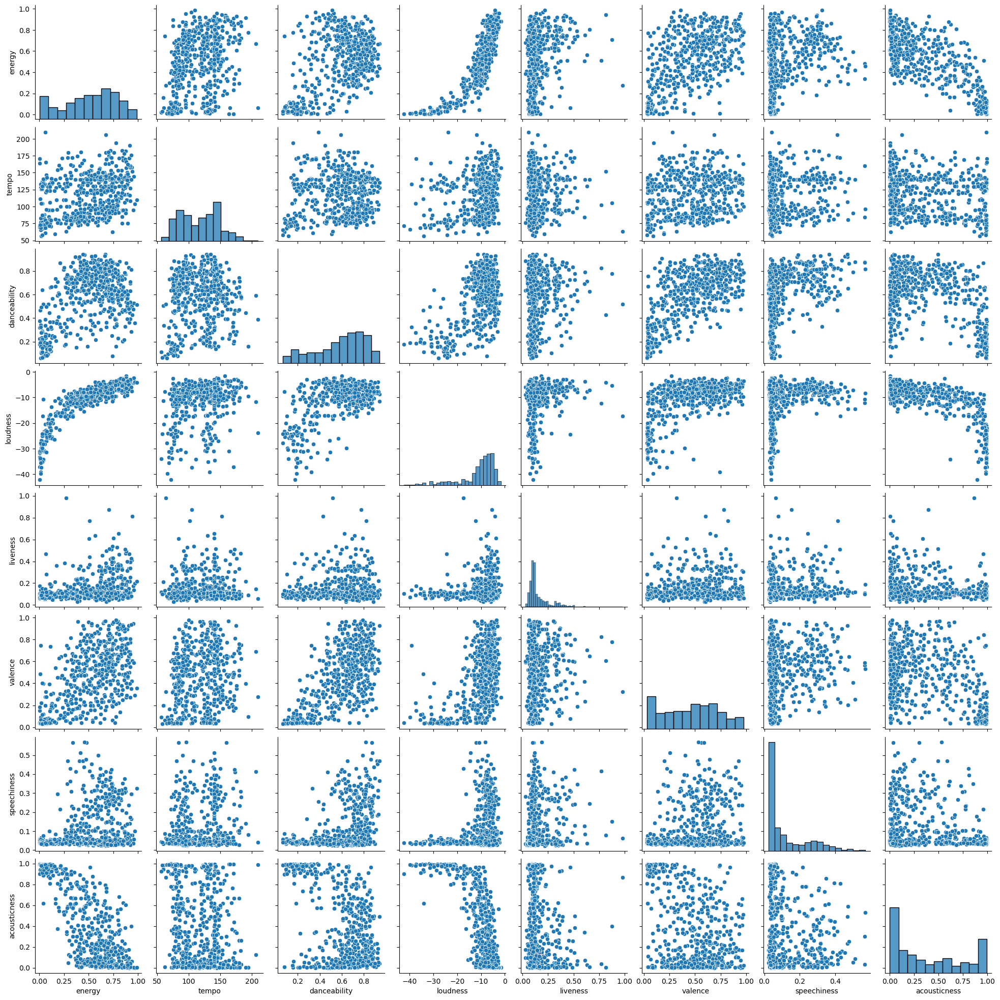

In [ ]:
figout = sns.pairplot(X_numerical)
plt.show()

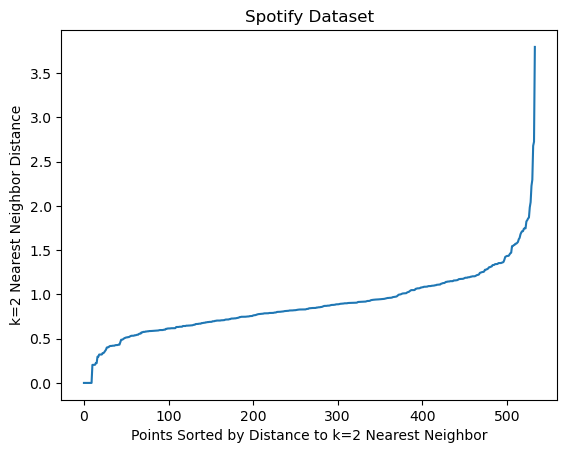

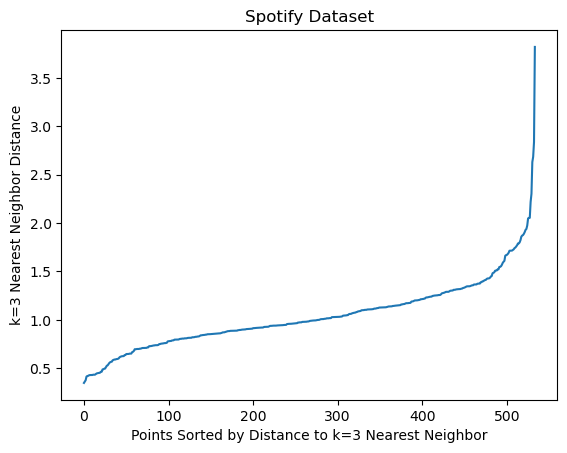

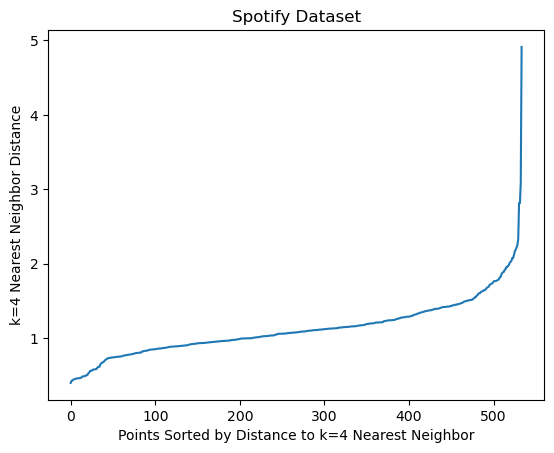

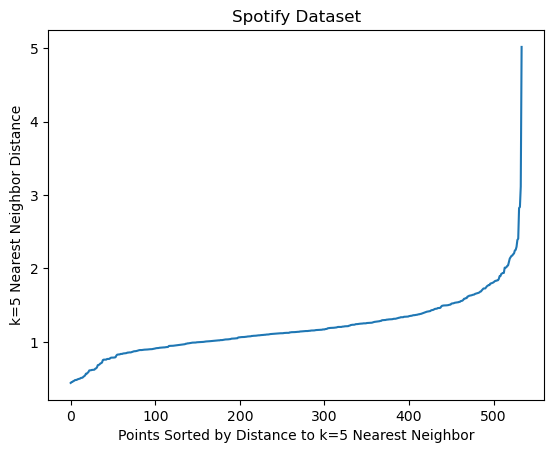

In [ ]:
# checking mutlidimensional outliers with KNN
X_num_scaled = pd.DataFrame(StandardScaler().fit_transform(X_numerical), columns = X_numerical.columns)

for k in range (2, 6):
    nbrs = NearestNeighbors(n_neighbors = k, algorithm = 'ball_tree').fit(X_num_scaled)
    distances, indices = nbrs.kneighbors(X_num_scaled)

    plt.plot(np.sort(distances.T[k - 1]))
    plt.xlabel('Points Sorted by Distance to k=%s Nearest Neighbor'%k)
    plt.ylabel('k=%s Nearest Neighbor Distance'%k)
    plt.title('Spotify Dataset')
    plt.show()

An initial examination of the dataset showed a small number of variables contained missing values. Several of the numerical audio features and categorical metadata fields each had a single missing observation. Relative to the original dataset size of 3,145 tracks, the amount of missing data was negligible. Thus, given the low frequency of missing values, rows containing missing entries were removed from the dataset. This approach ensures that all observations used in the analysis are complete and avoids the need to introduce imputed values that could distort the natural structure of the data. The primary downside of dropping rows with missing values is the potential loss of information. However, because the missingness only affected a couple of rows and appeared random rather than systematic, the risk of introducing this loss of information bias is very minimal.

To identify potential outliers in low-dimensional space, pairwise scatterplots were generated for all combinations of numerical audio features. There was definitely  some evidence of potential outliers existing at the edges of these variable distributions. While it was less clear in the pairwise plots whether outliers potentially exist, the k-nearest neighbors (KNN) distance analysis was conducted on the standardized numerical features. By plotting the sorted distance to each point's k-th nearest neighbor for multiple values of K, we clearly identified that there are observations unusually far from their local neighborhoods. These KNN distance plots showed a very noticeable increase in distance among a smaller number of points, suggesting evidence of outliers. There appear to be approximately 20 observations in the KNN distance plots that are potential outliers (of the 534 observations after reducing genres).

In the context of this project's research motivation, identified outliers should not be automatically removed. Tracks that are distant in feature space may represent uncommon musical styles, and excluding these observations could reduce the diversity of musical representations captured by the clustering analysis. Allowing outliers to associate with larger, more distant clusters enables the discovery of dominant musical patterns while not creating meaningless singleton song clusters. Algorithms that are overly sensitive to extreme values, such as k-means or HAC with single linkage may be affected by these points, while less sensitive or fuzzy clusterings can offer more robustness from these outliers.

The KNN distance plots indicate the presence of mild noise in the dataset, evidenced by a small number of observations with sharply increasing nearest-neighbor distances. However, because these points represent only a limited portion of the data, the dataset remains largely well-structured rather than dominated by random variation. Given the exploratory, recommendation-focused motivation of this analysis, these noisy observations were retained, as they may correspond to atypical or experimental tracks that are still meaningful for capturing diverse listener preferences. Their inclusion supports the use of clustering methods and evaluation approaches that are tolerant of irregular structure and emphasizes the importance of interpreting clustering results qualitatively alongside quantitative metrics.

Several additional data cleaning and preprocessing steps were performed. Musical key, mode, and time signature were converted from their original numeric encodings into meaningful categorical labels. This transformation does not alter the underlying information, but makes variables easier to interpret during exploratory analysis and visualization. The dataset was also restricted to four conventional genres - classical, hip-hop, rock, and jazz - to focus the clustering analysis on stylistically comparable music categories. This reduced our dataset to consist of only 534 observations, dropping approximately 2500 rows. Finally, the variables were explicitly separated into the numerical and categorical features, separating the numerical audio features we want to run our analysis on, and some categorical descriptors that may prove to have interesting insights post clustering. These steps were taken to obtain a cleaner and more interpretable dataset.

## 4. Basic Descriptive Analytics

In [ ]:
# numerical attribute summary statistics
X[cols_num].describe()

,energy,tempo,danceability,loudness,liveness,valence,speechiness,acousticness
count,534.000000,534.000000,534.000000,534.000000,534.000000,534.000000,534.000000,534.000000
mean,0.514267,117.287575,0.585656,-11.142009,0.160818,0.456871,0.121839,0.395035
std,0.264293,30.409539,0.222911,7.584281,0.122338,0.266743,0.119934,0.355194
min,0.004700,56.479000,0.062300,-42.238000,0.028900,0.030800,0.023100,0.000012
25%,0.331250,90.191500,0.452500,-12.314500,0.095175,0.225000,0.038925,0.060775
50%,0.559000,119.991000,0.637000,-8.691500,0.114000,0.476500,0.056650,0.287000
75%,0.722000,140.042250,0.764750,-6.206500,0.178750,0.659750,0.182500,0.706000
max,0.987000,209.852000,0.942000,-1.627000,0.979000,0.978000,0.569000,0.996000


In [ ]:
# counts of each categorical observation
print(f"\nCounts for genre:")
print(pd.DataFrame(df["playlist_genre"].value_counts()))


Counts for genre:
                count
playlist_genre       
hip-hop           168
jazz              145
classical         111
rock              110


The numerical attributes' basic summary statistics are shown above. Overall, the features display considerable variability across the 534 tracks in the dataset. Energy and danceability have moderate average values around 0.5, which is expected for a sample of songs. Other features, such as liveness, valence, speechiness, and acousticness, also vary substantially, indicating that the dataset captures a diverse set of musical characteristics, including mood, vocal presence, and intensity. This variability is expected as we have over 500 songs, and it is important for clustering, as it allows the algorithms to detect meaningful patterns in musical style and listener experience.

For the four genres in the cleaned dataset are relatively balanced:
* hip-hop (168 tracks)
* jazz (145 tracks)
* classical (111 tracks)
* rock (110 tracks).

Pairwise relationships between numerical attributes suggest some mild correlations - for example, danceability and energy tend to increase together. The most apparent correlation is between loudness and other attributes such as energy and liveness, which makes sense as we expect loud songs to be energetic(we can see this relationship in the pairwise plots). However, most numerical attributes appear to not have correlations.

## 5. Scaling Decisions

Given the differences in units and ranges across the numerical audio features, scaling the dataset is important. Features such as tempo and loudness are measured on different scales compared to bounded scores like energy or danceability, and without scaling, variables with larger numeric ranges could dominate distance-based clustering algorithms. Scaling the dataset makes sure that each numerical feature contributes equally to the computation of distances and cluster formation. To address this, all numerical attributes were scaled as follows.

In [ ]:
# scale numerical data
X_num_scaled = pd.DataFrame(StandardScaler().fit_transform(X_numerical), columns = cols_num, index = X_numerical.index)
X = pd.concat([X_categorical, X_num_scaled], axis = 1)

# display scaled data
X.head()

,playlist_genre,time_signature,key,mode,energy,tempo,danceability,loudness,liveness,valence,speechiness,acousticness
0,rock,4/4,C,Major,0.877623,0.494467,0.226061,0.970943,0.099671,-0.093326,-0.688854,-0.930603
1,rock,4/4,C,Major,1.214686,0.417807,-0.061318,0.649716,-0.741415,1.268809,-0.752282,-0.631332
2,rock,4/4,C,Major,1.097282,-0.191915,0.023998,0.507182,-0.646507,0.754725,-0.637945,-0.191724
3,jazz,4/4,C,Major,-1.553775,-1.343389,-0.640567,-0.778653,0.246942,-0.235919,-0.173920,1.459624
4,jazz,4/4,A,Minor,-0.160076,-1.211300,0.446086,0.191497,0.516941,0.068029,-0.768139,1.098920


## 6. Clusterability and Clustering Structure

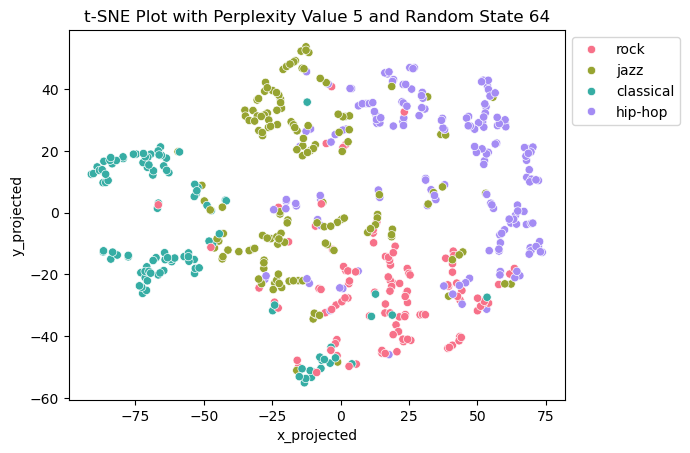

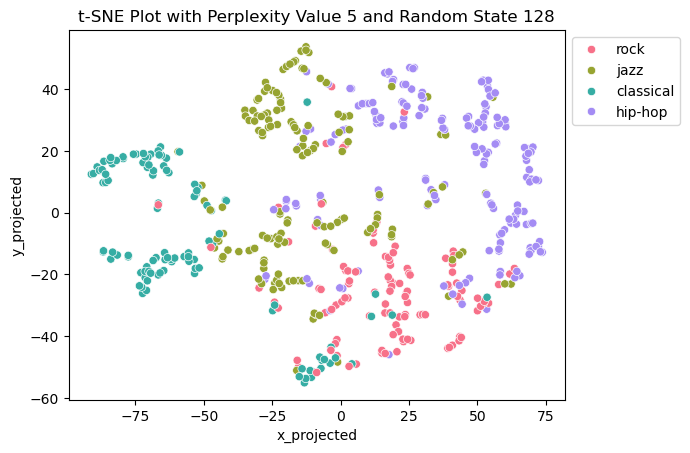

--------------------------------------------


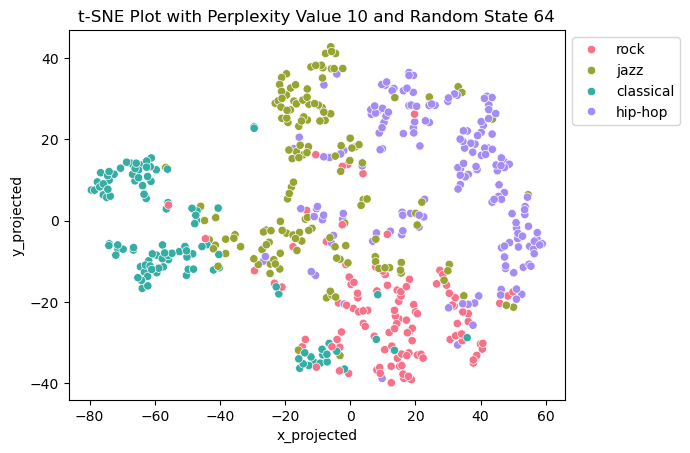

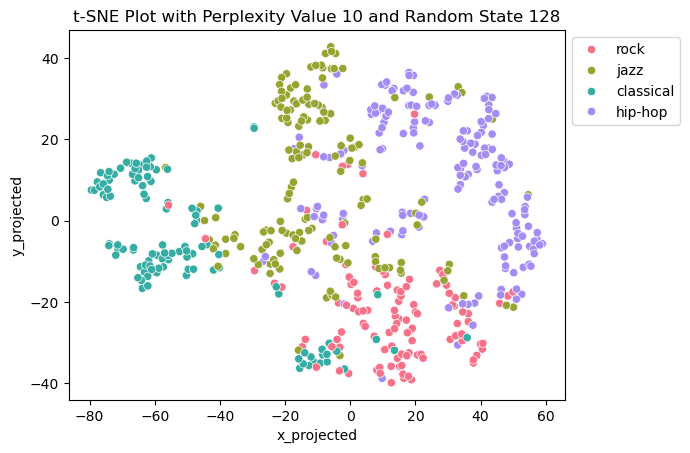

--------------------------------------------


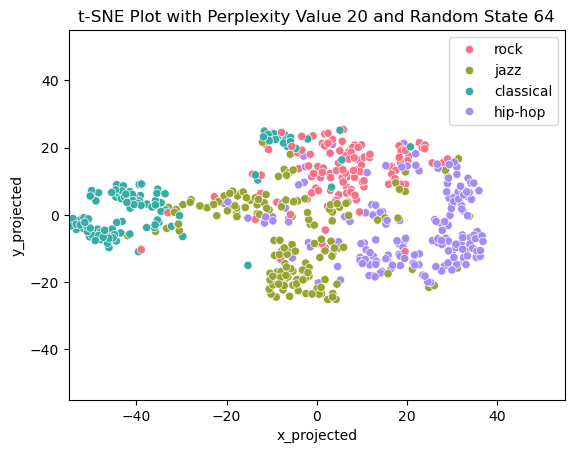

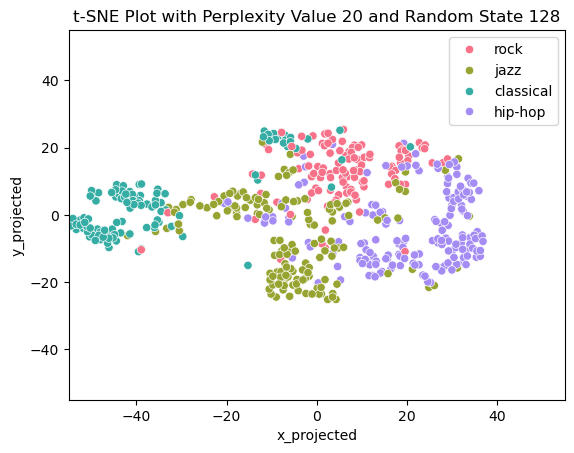

--------------------------------------------


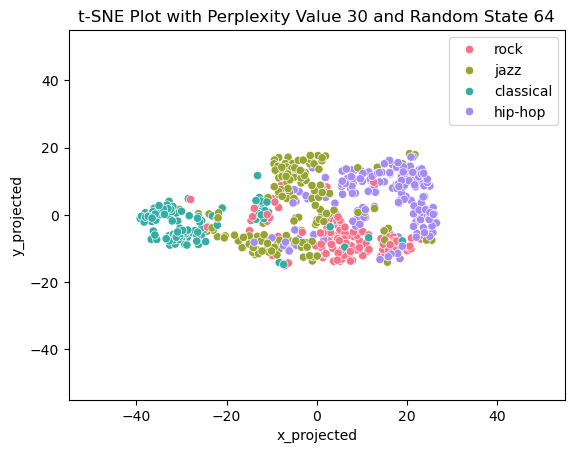

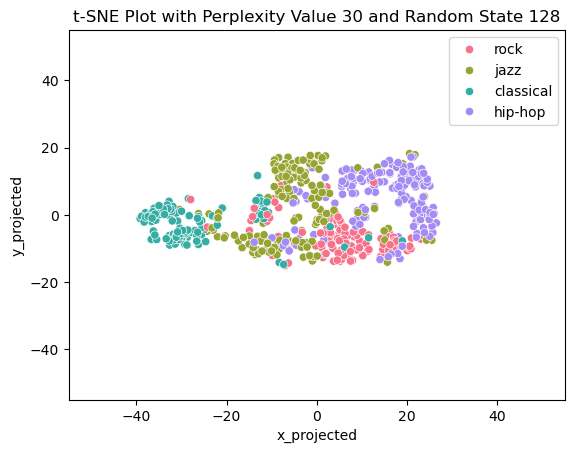

--------------------------------------------


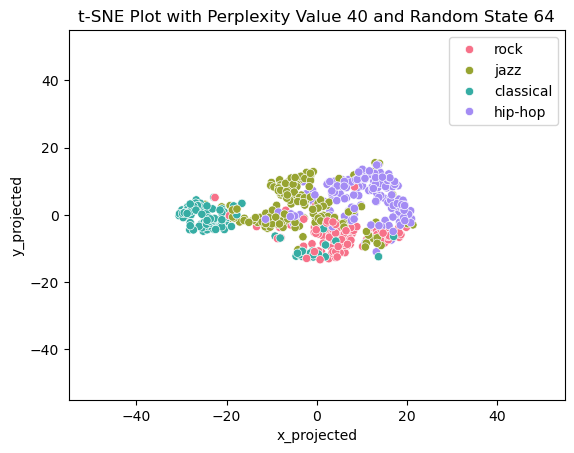

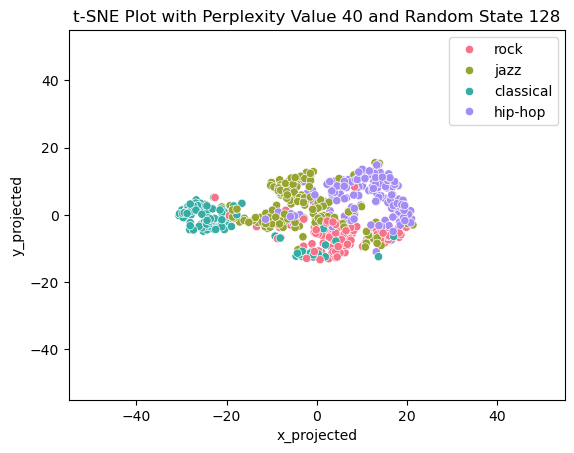

--------------------------------------------


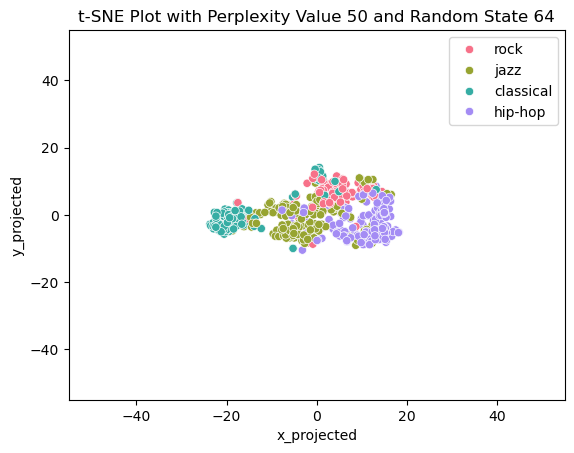

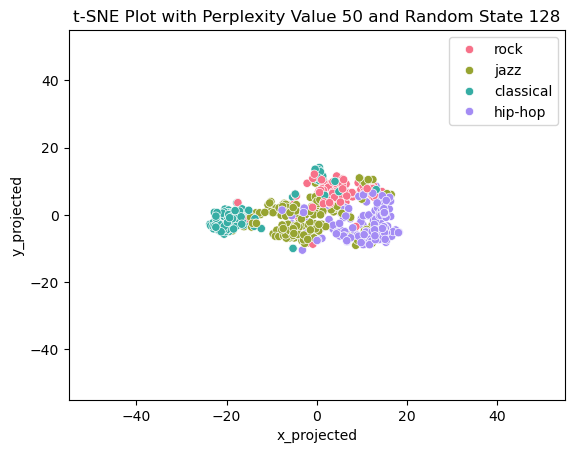

--------------------------------------------


In [ ]:
for perp in [5, 10, 20, 30, 40, 50]:
    for rs in [64, 128]:
        tsne = TSNE(n_components = 2, perplexity = perp, random_state = rs)
        data_tsne = tsne.fit_transform(X_num_scaled)
        df_tsne = pd.DataFrame(data_tsne, columns = ['x_projected', 'y_projected'])
        df_combo = pd.concat([X_num_scaled.reset_index(drop=True), df['playlist_genre'].reset_index(drop=True), df_tsne.reset_index(drop=True)], axis = 1)
        sns.scatterplot(x = 'x_projected', y = 'y_projected', hue = 'playlist_genre', palette=sns.color_palette("husl", len(df['playlist_genre'].unique())), data = df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        plt.legend(bbox_to_anchor = (1,1))
        if perp >= 20:
            plt.xlim(-55, 55)
            plt.ylim(-55, 55)
        plt.show()
    print('--------------------------------------------')

To explore cluster structure in the dataset, we created multiple t-SNE plots with six different perplexity values (5, 10, 20, 30, 40, 50) and two random states for each perplexity (64, 128). A representative plot with perplexity 30 and random state 128 is shown below, as it exhibits patterns consistent with other t-SNE visualizations.

The plots suggest that the numerical audio features are indeed clusterable, with clear structure present in the data. There are approximately three to four clusters discernible in the t-SNE plots. They are roughly convex in shape and moderately balanced in size. Some clusters, however, are not perfectly separated, indicating that there is partial overlap between certain groups. There is also minor evidence of nested cluster relationships - we can see the left most cluster appears it can be divided into two groups - although these nested cluster relationships are not strongly pronounced.

When the t-SNE plots are color coded by playlist genre, there is visible association between the genre labels and the inherent clusters suggested by the t-SNE plot. For example, classical tracks generally clearly align with the leftmost inherent cluster, and hip-hop aligns more with the rightmost inherent cluster, although with a partially overlapping cluster. This suggests that the numerical audio features meaningfully capture differences in musical characteristics that correspond somewhat to genre categories.

It is important to note t-SNE limitations when interpreting these plots:
* First, t-SNE does not preserve global distances accurately, so relative distances between inherent clusters may be distorted.
* Second, the algorithm cannot reveal the absolute density of points in high-dimensional space, so apparent cluster sizes in the t-SNE plots may not reflect the true distribution of songs.
* Third, the t-SNE plots are nondeterministic, and different random initializations can produce slightly different layouts, making exact inherent song cluster boundaries variable.
* Some nuanced higher dimensional relationships between numerical audio features may be lost or distorted in the 2D embedding.

(-55.0, 55.0)

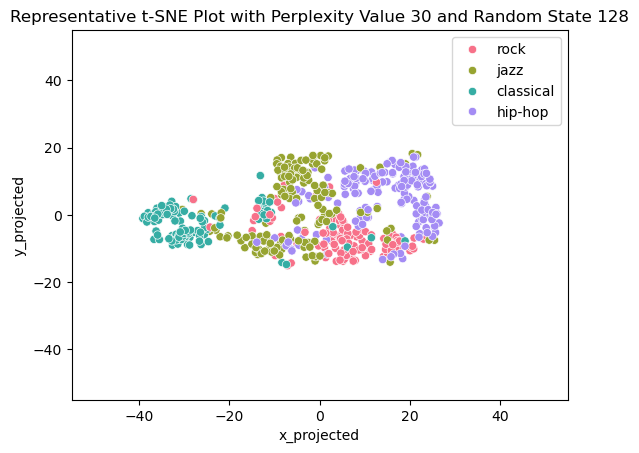

In [ ]:

tsne = TSNE(n_components = 2, perplexity = 30, random_state = 128)
data_tsne = tsne.fit_transform(X_num_scaled)
df_tsne = pd.DataFrame(data_tsne, columns = ['x_projected', 'y_projected'])
df_combo = pd.concat([X_num_scaled.reset_index(drop = True), df['playlist_genre'].reset_index(drop = True), df_tsne.reset_index(drop = True)], axis = 1)
sns.scatterplot(x = 'x_projected', y = 'y_projected', hue = 'playlist_genre', palette = sns.color_palette("husl", len(df['playlist_genre'].unique())), data = df_combo)
plt.title('Representative t-SNE Plot with Perplexity Value 30 and Random State 128')
plt.legend(bbox_to_anchor = (1, 1))
plt.xlim(-55, 55)
plt.ylim(-55, 55)

## 7. Clustering Algorithm Selection Motivation

We selected Gaussian Mixture Models (GMM) as our first clustering algorithm for the Spotify dataset. GMM is a model-based clustering approach that assumes the data are generated from a mixture of underlying Gaussian distributions, allowing us to estimate cluster and membership probabilities and the shape of each cluster. Unlike fuzzy c-means, GMM does not require pre-specifying a fuzziness parameter, making it easier to apply in our exploratory setting.

* Cluster shape flexibility: Our t-SNE analysis indicated the inherent clusters are roughly convex but not perfectly spherical. GMM works well with ellipsoidal cluster with varying orientation and scale. This makes GMM much better suited than k-menas for clusters that are elongated.
* Fuzzy clustering: GMM provides fuzzy membership probabilites for each song, reflecting the reality that some songs may share characteristics across multiple clusters. This aligns well with what we saw in our t-SNE plots - our inherent clusters appear to be partially overlapped. This also aligns well with our research motivation of a nuanced understanding of musical groupings. the soft assignments also help detect potential elbow points between clusters.
* Model compatability with numerical features: The Spotify dataset consists of standardized continuous audio features. GMM is designed for this type of data and does not perform well with categorical and binary data. So by deciding to only use our numerical audio features we are able to use GMM.

In summary, GMM's ability to handle elliptical, overlapping clusters, provide soft cluster assignments, and model Gaussian shaped data makes it a natural choice for exploring the structure of musical audio features in this dataset.




The second clustering algorithm we selected is Hierarchical Agglomerative Clustering with Complete and Ward's linkage. Single linkage was intentionally excluded because it is highly sensitive to outliers and prone to chaining effects, which can distort our cluster structure considering our clusters appear to have poor separation and outliers.

* Exploratory hierarchical insight: HAC provides a dendrogram that reveals hierarchical and potentially nest relationship between songs. This supports our research motivation of exploring the underlying structure of the audio feature space beyond flat cluster assignments, especially given the weak evidence of subclusters observed above.

* Not sensitive to outliers and noise: Complete linkage is much less susceptible to individual outliers pulling clusters together. This is appropriate for our dataset, where a small number of songs may have extreme audio features that should not dominate cluster formation. Complete linkage is less likely to pick out singleton song clusters which we do not want in our analysis, making it a good option for our clustering algorithm.

* Better at identifying poor separated clusters: Complete linkage favors tighter, more compact clusters and discourages chaining, which helps distinguish clusters that are close together in feature space. This aligns with our t-SNE observations showing moderate overlap between inherent clusters rather than strong separation.

* Minimizing within-cluster variance: Ward's linkage ensures that songs grouped together are highly similar in their audio features, resulting in cohesive and interpretable clusters. This can prove particularly important for large within-cluster variance would indicate that songs in the same cluster differ substantially in musical characteristics.

In summary, Ward’s and Complete linkages provide complementary perspectives on cluster compactness and separation, allowing us to better assess the structure of inherent song groupings in the dataset.



## 8. Clustering Algorithm #1: GMM



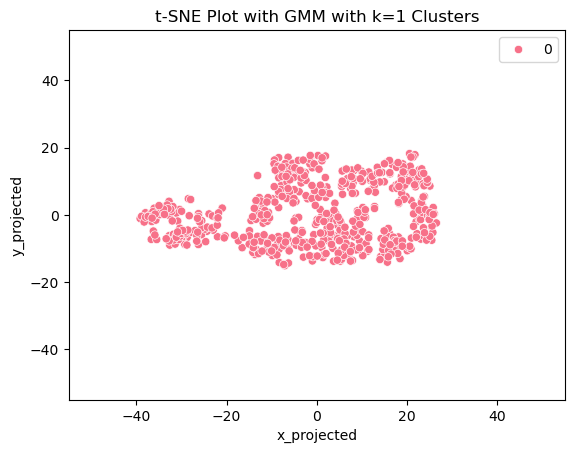

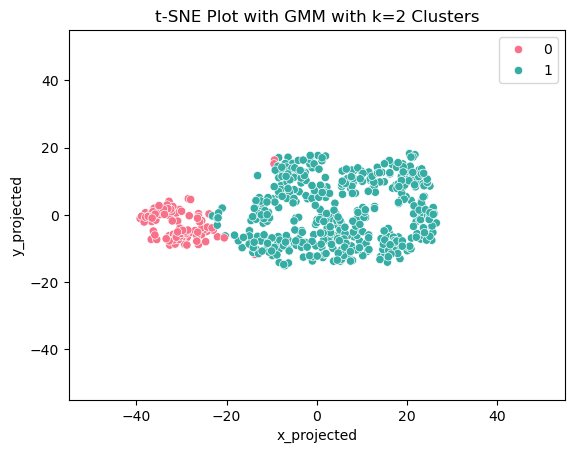

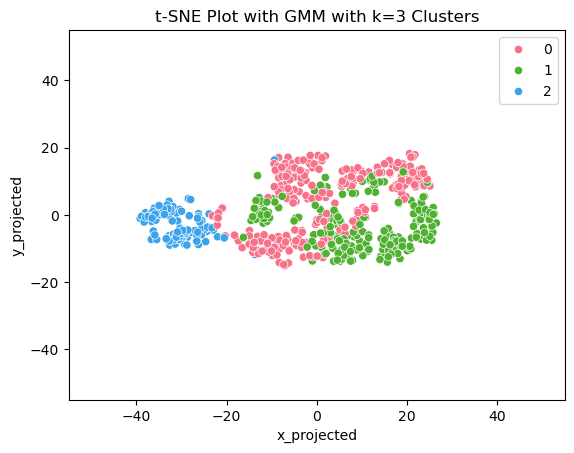

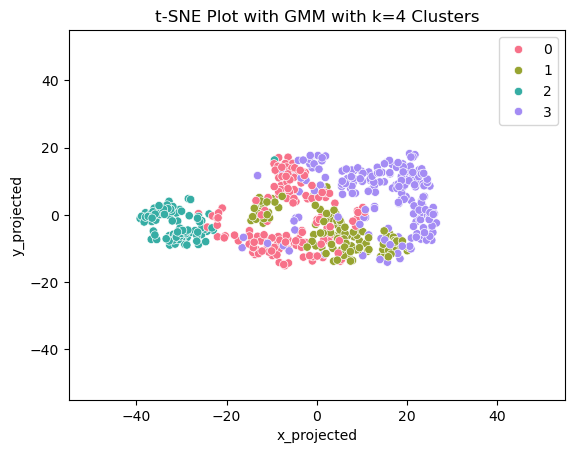

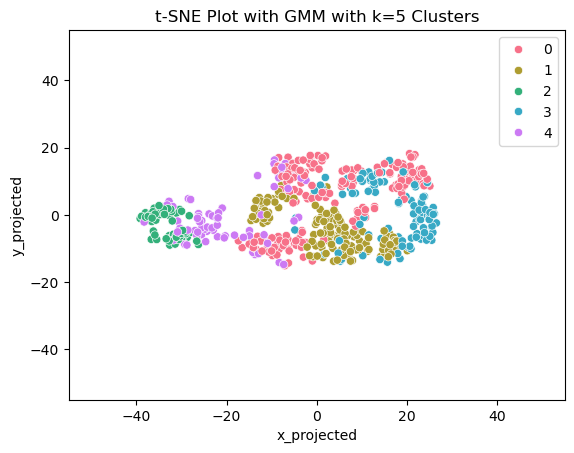

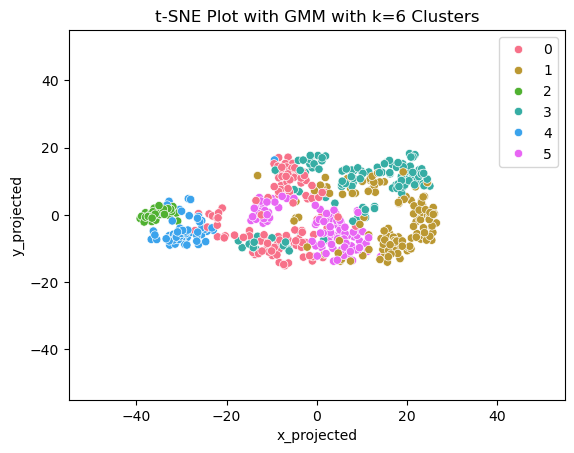

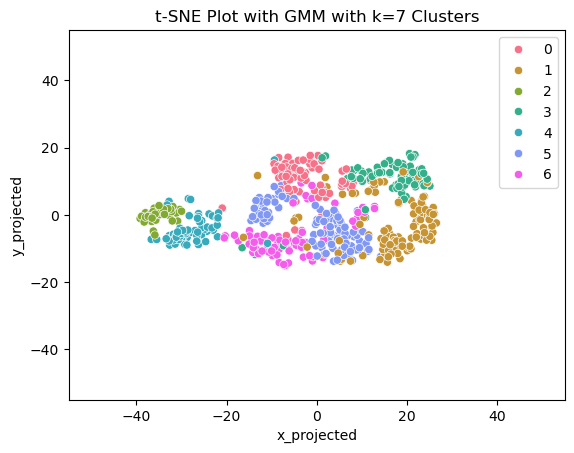

In [ ]:
tsne = TSNE(n_components=2, perplexity=30, random_state=128)
data_tsne = tsne.fit_transform(X_num_scaled)
df_tsne = pd.DataFrame(data_tsne, columns=["x_projected", "y_projected"])

df_combo = pd.concat(
    [
        X_num_scaled.reset_index(drop=True),
        df["playlist_genre"].reset_index(drop=True),
        df_tsne.reset_index(drop=True),
    ],
    axis=1,
)


for i in range(1, 8):
	gmm = GaussianMixture(n_components=i, random_state=100).fit(X_num_scaled)
	p = gmm.predict_proba(X_num_scaled)
	df_combo["predicted_cluster"] = p.argmax(1)

	sns.scatterplot(
		x="x_projected",
		y="y_projected",
		hue="predicted_cluster",
		palette=sns.color_palette("husl", i),
		data=df_combo,
	)
	plt.title(f"t-SNE Plot with GMM with k={i} Clusters")
	plt.legend(bbox_to_anchor=(1, 1))
	plt.xlim(-55, 55)
	plt.ylim(-55, 55)
	plt.show()

When analyzing multiple different GMM clustering options with $k \in \{1,8\}$ clusters, there are multiple clustering setups that seem viable, such as $k=2$ and $k=4$. There is reason to believe that these clusterings are in line with our research goals in the sense that they are able to find groups of songs that have similar traits. Also, with high dimensionality, we are bound to have some bleeding across clusters, but this also lets us find songs that share traits from the clusters the algorithm find.

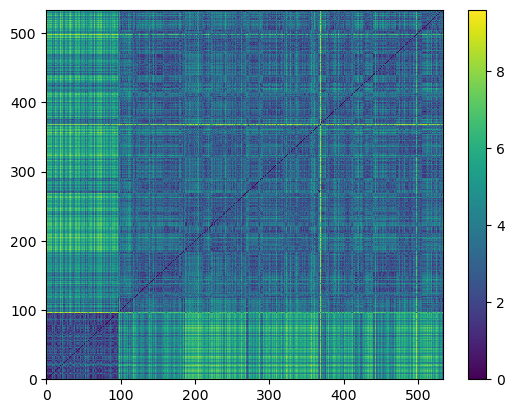

gmm_predicted_cssm
0     96
1    534
Name: count, dtype: int64


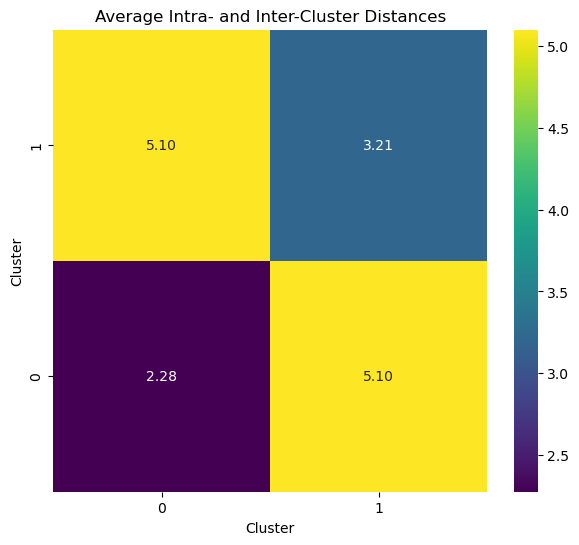

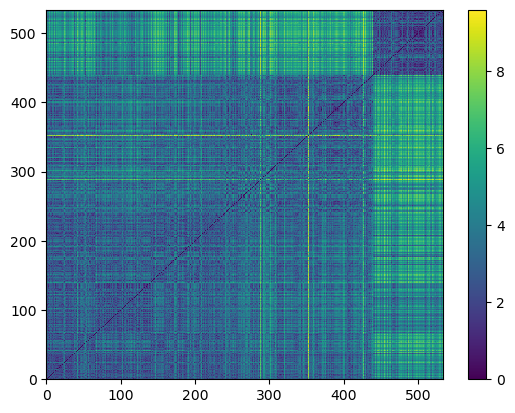

gmm_predicted_cssm
0    240
1    439
2    534
Name: count, dtype: int64


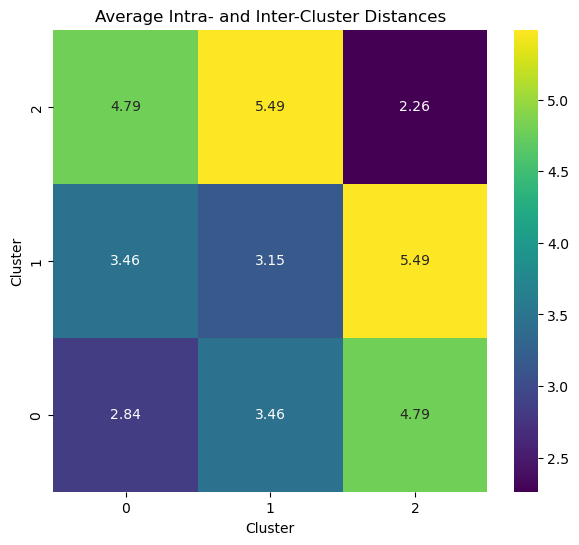

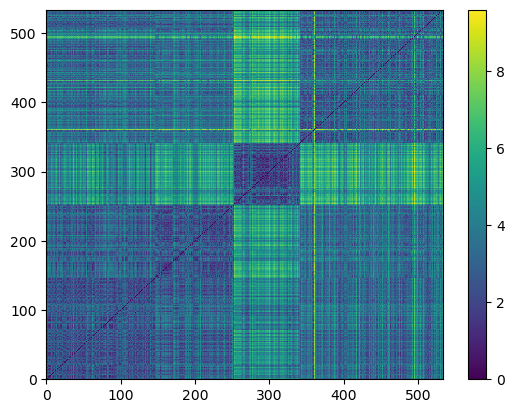

gmm_predicted_cssm
0    146
1    252
2    342
3    534
Name: count, dtype: int64


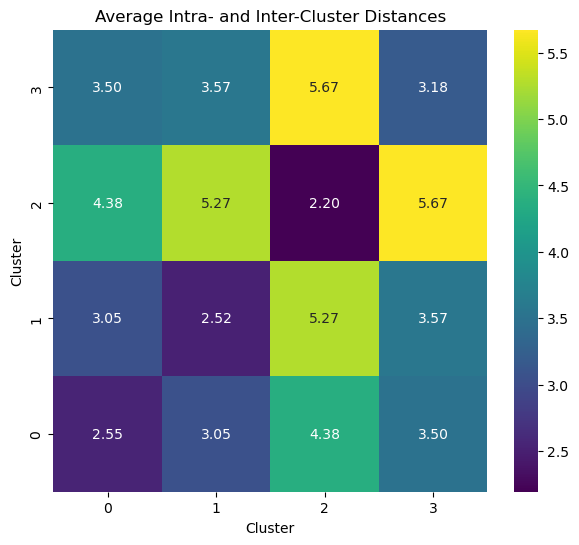

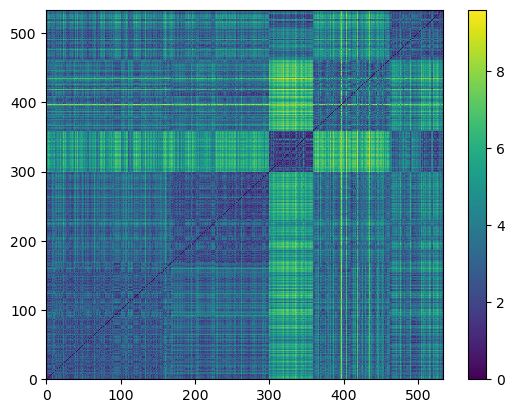

gmm_predicted_cssm
0    168
1    299
2    359
3    461
4    534
Name: count, dtype: int64


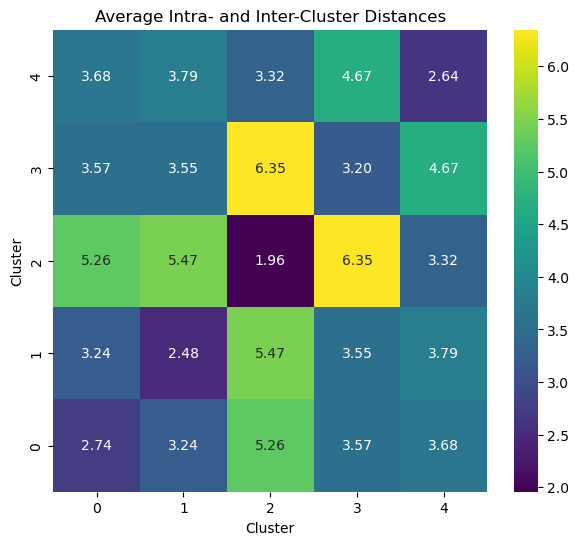

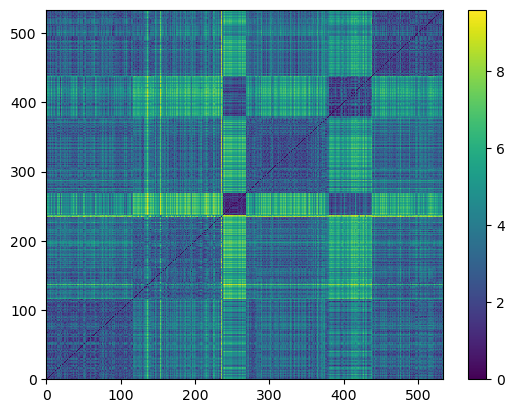

gmm_predicted_cssm
0    116
1    238
2    269
3    381
4    438
5    534
Name: count, dtype: int64


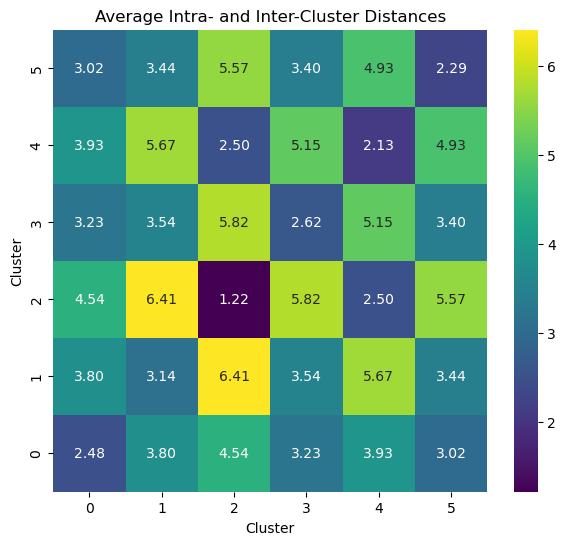

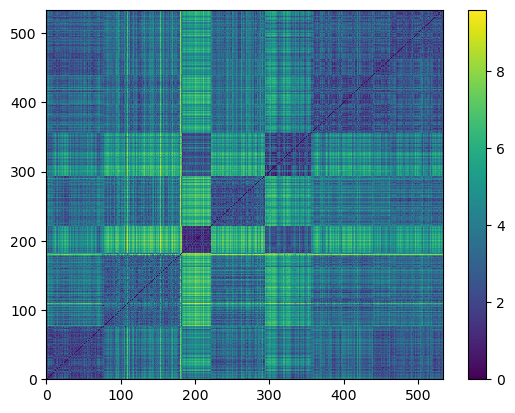

gmm_predicted_cssm
0     75
1    183
2    221
3    294
4    356
5    463
6    534
Name: count, dtype: int64


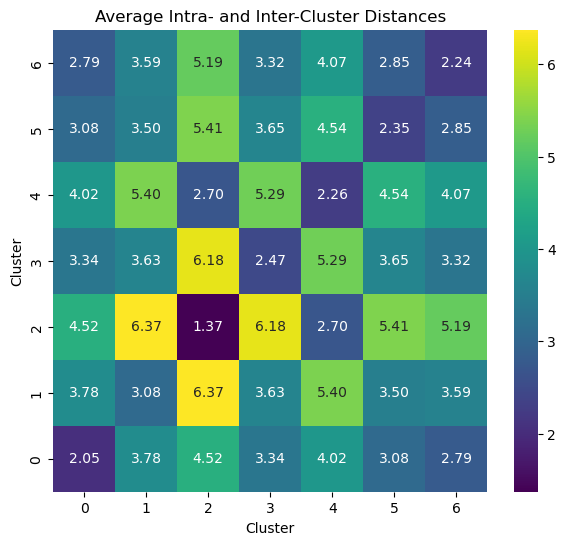

In [ ]:
for k in range(2, 8):
    gmm = GaussianMixture(n_components=k, random_state=100)
    X['gmm_predicted_cssm'] = gmm.fit_predict(X_num_scaled)

    X_sorted = X.sort_values(by=["gmm_predicted_cssm"])
    X_sorted = X_sorted.reset_index(drop=True)

    dist_mat = squareform(pdist(X_sorted[cols_num], metric="euclidean"))

    plt.pcolormesh(dist_mat)
    plt.colorbar()
    N = len(X_sorted)
    plt.xlim([0, N])
    plt.ylim([0, N])
    plt.show()

    end_points = X["gmm_predicted_cssm"].value_counts().sort_index().cumsum()
    print(end_points)

    avg_dist_mat = np.zeros((len(end_points), len(end_points)))
    for i in range(0, len(end_points)):
        for j in range(0, len(end_points)):
            start_i = 0 if i == 0 else end_points[i - 1]
            start_j = 0 if j == 0 else end_points[j - 1]
            end_i = end_points[i]
            end_j = end_points[j]

            block = dist_mat[start_i:end_i, start_j:end_j]
            avg_dist_mat[i, j] = block.mean()

    avg_dist_df = pd.DataFrame(
        avg_dist_mat, index=range(0, len(end_points)), columns=range(0, len(end_points))
    )
    avg_dist_df_flipped = avg_dist_df.iloc[::-1]
    plt.figure(figsize=(7, 6))
    sns.heatmap(avg_dist_df_flipped, annot=True, fmt=".2f", cmap="viridis")
    plt.title("Average Intra- and Inter-Cluster Distances")
    plt.ylabel("Cluster")
    plt.xlabel("Cluster")
    plt.show()

The clusterings with $k=2$ and $k=4$ show the best cohesion and separation. We can see evidence of maybe one outlier with these two clustering options, but that could indicate a unique song and should not be removed as its features can still be useful when finding similar songs. However, the fact that the inherent clusters we see in the original tSNE plot are not well separated, which will affect the quality of our cluster sorted similarity results as they the off diagnoals won't be as yellow as they should be.

-----------
Clusterings with k= 2 Clusters
-----------
   Cluster 0 Membership Score  Cluster 1 Membership Score
0                1.842668e-46                         1.0
1                4.829805e-50                         1.0
2                1.429504e-40                         1.0
3                8.372306e-13                         1.0
4                8.512101e-08                         1.0
[np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(0), np.int64(0), np.int64(1), np.int64(0), np.int64(1), np.int64(0), np.int64(0), np.int64(0), np.int64(1), np.int64(1), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(1), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(1), np.int64(0), np.int64(1), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0)

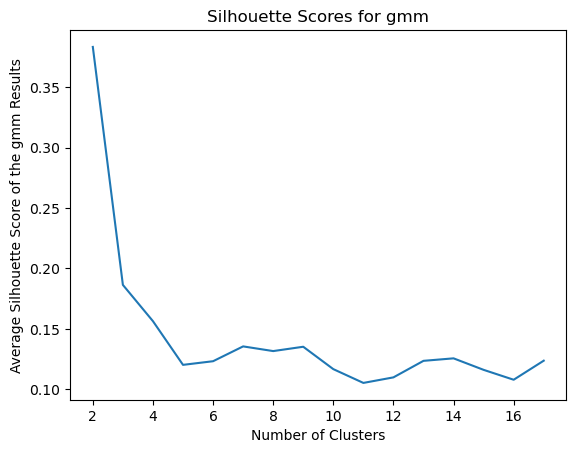

In [ ]:
from sklearn.metrics import silhouette_score

cluster_num_list = range(2, 18)
main_sil_list = []

for n_clusters in cluster_num_list:
    avg_silhouette_list = []
    print("-----------")
    print("Clusterings with k= " + str(n_clusters) + " Clusters")
    print("-----------")
    gmm = GaussianMixture(n_components=n_clusters, random_state=100).fit(X_num_scaled)
    cluster_columns = [
        "Cluster %s Membership Score" % (str(i)) for i in range(0, n_clusters)
    ]

    W = gmm.predict_proba(X_num_scaled)

    df_membership = pd.DataFrame(W, columns=cluster_columns)

    print(df_membership.head())
    partition_cluster_labels = [
        df_membership.T[i].argmax() for i in range(0, len(df_membership))
    ]
    print(partition_cluster_labels)
    X["predicted_cluster_silhouette"] = partition_cluster_labels
    print(X["predicted_cluster_silhouette"].shape)
    silhouette = silhouette_score(X_num_scaled, X["predicted_cluster_silhouette"])
    print("Silhouette score: " + str(silhouette))
    main_sil_list.append(silhouette)

plt.plot(cluster_num_list, main_sil_list)
plt.xlabel("Number of Clusters")
plt.ylabel("Average Silhouette Score of the gmm Results")
plt.title("Silhouette Scores for gmm")
plt.show()

Some clusterings with high silhouette scores includ $k=2$, $k=3$, and $k=4$. Considering we only used 4 genres with a couple of them being known to pass boundaries (rock + hip-hop, jazz + hip-hop), this makes sense that cluster numbers less than 4 can be viable, as songs with a blend of jazz and hip-hop might be grouped together with actual jazz or hip-hop songs. The reason why this silhouette score is so low is due to the fact that the clusters are not well separated in the original data, something that silhouette score is very sensitive to. There does not seem to be a blatant reason as to why the clustering option with the highest average silhouette score would be unable to find the inherent clusters other than that reason, and this also adds to why the silhouette score is so low to begin with. Given the observed overlap in the data, silhouette score—which heavily penalizes poorly separated clusters—may underestimate the quality of more granular but meaningful clusterings. As a result, the silhouette analysis supports but does not dominate our selection of $k=4$.

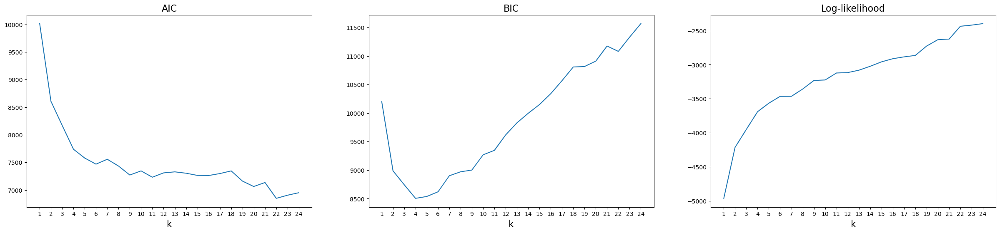

In [ ]:
from sklearn.mixture import GaussianMixture

aics = []
bics = []
log_likelihoods = []

for k in range(1, 25):
    # Fit the GMM model
    gm = GaussianMixture(n_components=k, random_state=100)
    gm.fit(X_num_scaled)

    # Calculate the AIC, BIC, and log-likelihood for this model
    aics.append(gm.aic(X_num_scaled))
    bics.append(gm.bic(X_num_scaled))
    log_likelihoods.append(gm.score(X_num_scaled) * len(X_num_scaled))


# Plot these values
fig, ax = plt.subplots(1, 3, figsize=(30, 6))

# AIC
ax[0].plot(range(1, 25), aics)
ax[0].set_xticks(range(1, 25))
ax[0].set_xlabel("k", fontsize=16)
ax[0].set_title("AIC", fontsize=16)

# BIC
ax[1].plot(range(1, 25), bics)
ax[1].set_xticks(range(1, 25))
ax[1].set_xlabel("k", fontsize=16)
ax[1].set_title("BIC", fontsize=16)

# Log-likelihood
ax[2].plot(range(1, 25), log_likelihoods)
ax[2].set_xticks(range(1, 25))
ax[2].set_xlabel("k", fontsize=16)
ax[2].set_title("Log-likelihood", fontsize=16)

plt.show()

We usually want to go for a clustering options with the lowest AIC and BIC, and the $k$ value that overwhelmingly aligns with this is $k=4$, as it has a fairly low AIC and the lowest BIC. One potential shortcoming for this approach is the fact that we have acknowledged that there is some bleed amongst clusters, which may hurt the $k$ selected through this method.

In [ ]:
gm_2 = GaussianMixture(n_components=2, random_state=100)
gm_3 = GaussianMixture(n_components=3, random_state=100)
gm_4 = GaussianMixture(n_components=4, random_state=100)

gm_2.fit(X_num_scaled)
gm_3.fit(X_num_scaled)
gm_4.fit(X_num_scaled)


W_2 = gm_2.predict_proba(X_num_scaled)
W_3 = gm_3.predict_proba(X_num_scaled)
W_4 = gm_4.predict_proba(X_num_scaled)

print(np.shape(W_2))
print(np.shape(W_3))
print(np.shape(W_4))

(534, 2)
(534, 3)
(534, 4)


In [ ]:
cluster_columns_2 = ["Cluster %s Membership Score k = 2" % (str(i)) for i in range(0, 2)]
cluster_columns_3 = ["Cluster %s Membership Score k = 3" % (str(i)) for i in range(0, 3)]
cluster_columns_4 = ["Cluster %s Membership Score k = 4" % (str(i)) for i in range(0, 4)]
df_membership_2 = pd.DataFrame(W_2, columns=cluster_columns_2)
df_membership_3 = pd.DataFrame(W_3, columns=cluster_columns_3)
df_membership_4 = pd.DataFrame(W_4, columns=cluster_columns_4)
df_membership_2.round(4)
df_membership_3.round(4)
df_membership_4.round(4)
print(df_membership_2.head())
print(df_membership_3.head())
print(df_membership_4.head())

   Cluster 0 Membership Score k = 2  Cluster 1 Membership Score k = 2
0                      1.842668e-46                               1.0
1                      4.829805e-50                               1.0
2                      1.429504e-40                               1.0
3                      8.372306e-13                               1.0
4                      8.512101e-08                               1.0
   Cluster 0 Membership Score k = 3  Cluster 1 Membership Score k = 3  \
0                          0.034752                          0.965248   
1                          0.418490                          0.581510   
2                          0.910085                          0.089915   
3                          0.999997                          0.000003   
4                          0.993823                          0.006175   

   Cluster 2 Membership Score k = 3  
0                      6.408559e-45  
1                      3.964400e-49  
2                      1.09

In [ ]:
highest_membership_scores_2 = df_membership_2.T.max()
highest_membership_scores_3 = df_membership_3.T.max()
highest_membership_scores_4 = df_membership_4.T.max()

print(highest_membership_scores_2)
print(highest_membership_scores_3)
print(highest_membership_scores_4)

0      1.0
1      1.0
2      1.0
3      1.0
4      1.0
      ... 
529    1.0
530    1.0
531    1.0
532    1.0
533    1.0
Length: 534, dtype: float64
0      0.965248
1      0.581510
2      0.910085
3      0.999997
4      0.993823
         ...   
529    0.874785
530    0.710005
531    0.971880
532    0.962084
533    0.999342
Length: 534, dtype: float64
0      0.989430
1      0.779774
2      0.986201
3      0.983589
4      0.997377
         ...   
529    0.630541
530    0.954996
531    0.973386
532    0.968603
533    0.999719
Length: 534, dtype: float64


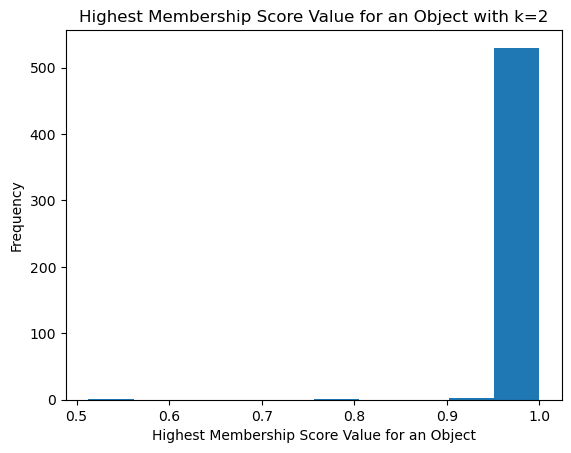

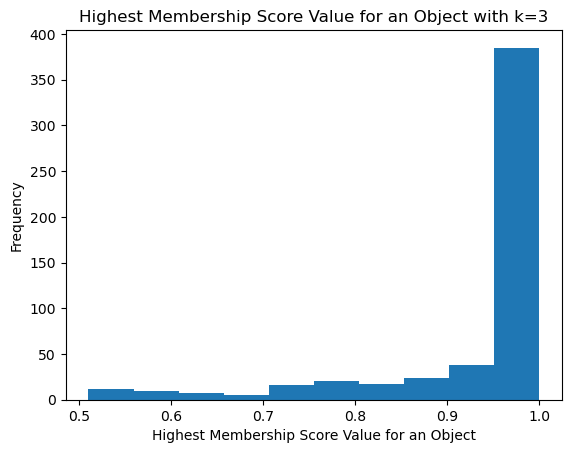

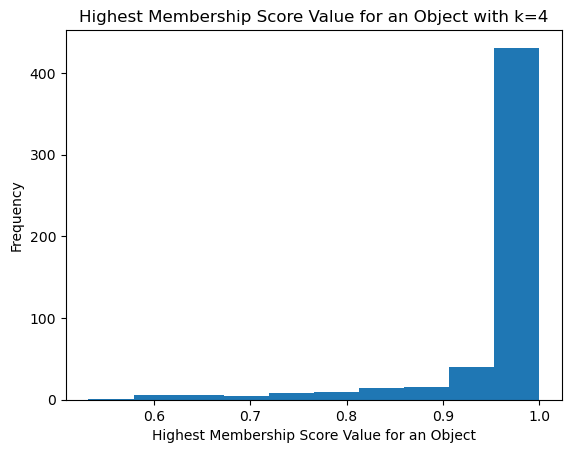

In [ ]:
plt.hist(highest_membership_scores_2)
plt.title("Highest Membership Score Value for an Object with k=2")
plt.xlabel("Highest Membership Score Value for an Object")
plt.ylabel("Frequency")
plt.show()

plt.hist(highest_membership_scores_3)
plt.title("Highest Membership Score Value for an Object with k=3")
plt.xlabel("Highest Membership Score Value for an Object")
plt.ylabel("Frequency")
plt.show()

plt.hist(highest_membership_scores_4)
plt.title("Highest Membership Score Value for an Object with k=4")
plt.xlabel("Highest Membership Score Value for an Object")
plt.ylabel("Frequency")
plt.show()



This shows that the clustering is fairly hard when k=3, the softest when k=2, and a balance between the two when k=4.

In [ ]:
print(highest_membership_scores_2.sort_values())
print(highest_membership_scores_3.sort_values())
print(highest_membership_scores_4.sort_values())

245    0.512734
255    0.783802
85     0.935079
7      0.950146
24     0.963774
         ...   
195    1.000000
194    1.000000
193    1.000000
205    1.000000
533    1.000000
Length: 534, dtype: float64
451    0.510580
373    0.518551
351    0.530220
110    0.536078
343    0.536753
         ...   
384    1.000000
31     1.000000
504    1.000000
319    1.000000
204    1.000000
Length: 534, dtype: float64
522    0.532180
158    0.581964
182    0.589165
206    0.589201
13     0.592353
         ...   
430    1.000000
58     1.000000
428    1.000000
162    1.000000
294    1.000000
Length: 534, dtype: float64


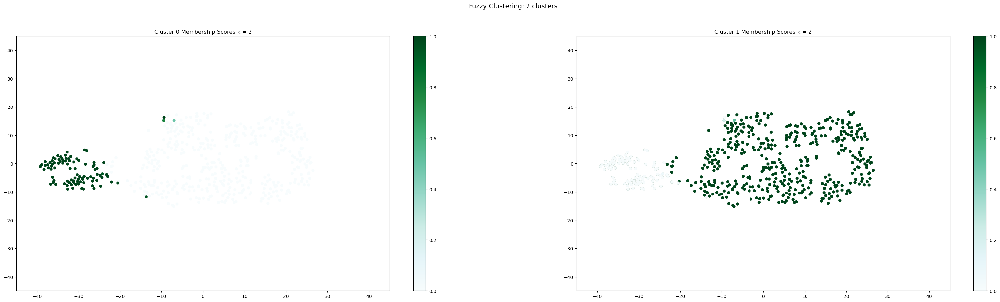

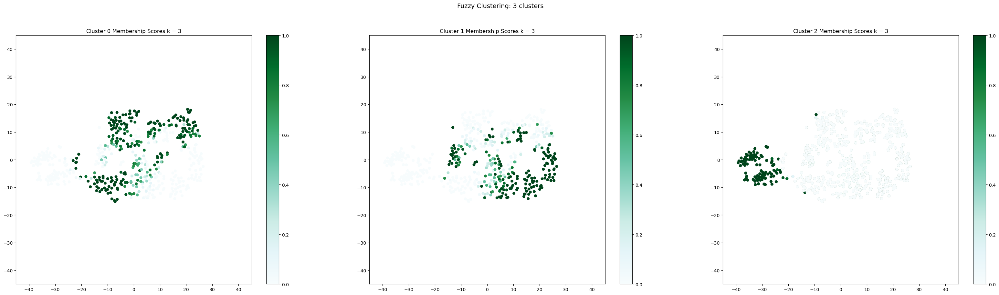

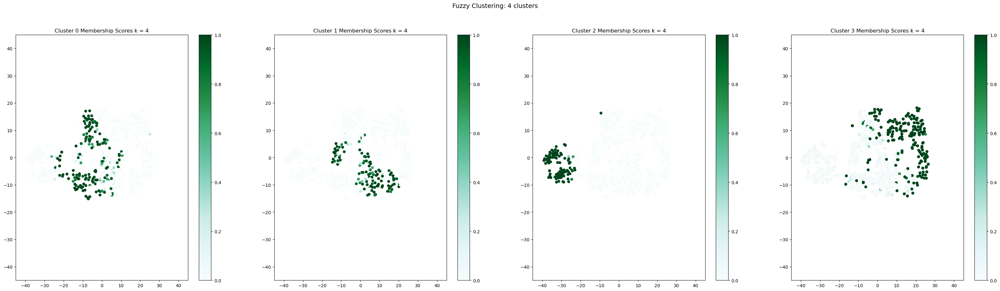

In [ ]:
# Color code t-SNE Plots
fig, ax = plt.subplots(1, 2, figsize=(40, 10))
plt.suptitle("Fuzzy Clustering: %s clusters" % (2), fontsize=14)
for i in range(0, 2):

    # Create a column with cluster i membership scores
    df_combo["Cluster %s Membership Score k = 2" % str(i)] = df_membership_2[
        "Cluster %s Membership Score k = 2" % (str(i))
    ]

    # Plot the points, color coded by the membership score.
    points = plt.scatter(
        df_combo["x_projected"],
        df_combo["y_projected"],
        c=df_combo["Cluster %s Membership Score k = 2" % str(i)],
        s=30,
        cmap="BuGn",
        vmin=0,
        vmax=1,
    )
    ax[i].scatter(
        df_combo["x_projected"],
        df_combo["y_projected"],
        c=df_combo["Cluster %s Membership Score k = 2" % str(i)],
        s=30,
        cmap="BuGn",
        vmin=0,
        vmax=1,
    )

    fig.colorbar(points, ax=ax[i])
    ax[i].set_title("Cluster %s Membership Scores k = 2" % (str(i)))
    ax[i].set_xlim(-45, 45)
    ax[i].set_ylim(-45, 45)
plt.show()

fig, ax = plt.subplots(1, 3, figsize=(40, 10))
plt.suptitle("Fuzzy Clustering: %s clusters" % (3), fontsize=14)
for i in range(0, 3):

    # Create a column with cluster i membership scores
    df_combo["Cluster %s Membership Score k = 3" % str(i)] = df_membership_3[
        "Cluster %s Membership Score k = 3" % (str(i))
    ]

    # Plot the points, color coded by the membership score.
    points = plt.scatter(
        df_combo["x_projected"],
        df_combo["y_projected"],
        c=df_combo["Cluster %s Membership Score k = 3" % str(i)],
        s=30,
        cmap="BuGn",
        vmin=0,
        vmax=1,
    )
    ax[i].scatter(
        df_combo["x_projected"],
        df_combo["y_projected"],
        c=df_combo["Cluster %s Membership Score k = 3" % str(i)],
        s=30,
        cmap="BuGn",
        vmin=0,
        vmax=1,
    )

    fig.colorbar(points, ax=ax[i])
    ax[i].set_title("Cluster %s Membership Scores k = 3" % (str(i)))
    ax[i].set_xlim(-45, 45)
    ax[i].set_ylim(-45, 45)
plt.show()

fig, ax = plt.subplots(1, 4, figsize=(40, 10))
plt.suptitle("Fuzzy Clustering: %s clusters" % (4), fontsize=14)
for i in range(0, 4):

    # Create a column with cluster i membership scores
    df_combo["Cluster %s Membership Score k = 4" % str(i)] = df_membership_4[
        "Cluster %s Membership Score k = 4" % (str(i))
    ]

    # Plot the points, color coded by the membership score.
    points = plt.scatter(
        df_combo["x_projected"],
        df_combo["y_projected"],
        c=df_combo["Cluster %s Membership Score k = 4" % str(i)],
        s=30,
        cmap="BuGn",
        vmin=0,
        vmax=1,
    )
    ax[i].scatter(
        df_combo["x_projected"],
        df_combo["y_projected"],
        c=df_combo["Cluster %s Membership Score k = 4" % str(i)],
        s=30,
        cmap="BuGn",
        vmin=0,
        vmax=1,
    )

    fig.colorbar(points, ax=ax[i])
    ax[i].set_title("Cluster %s Membership Scores k = 4" % (str(i)))
    ax[i].set_xlim(-45, 45)
    ax[i].set_ylim(-45, 45)
plt.show()

In [ ]:
highest_membership_scores_2.sort_values()
print(df_membership_2.iloc[highest_membership_scores_2.sort_values().head(10).index])
print(df.iloc[highest_membership_scores_2.sort_values().head(10).index][
    ["track_name", "playlist_genre", "track_artist"]
])

highest_membership_scores_3.sort_values()
print(df_membership_3.iloc[highest_membership_scores_3.sort_values().head(10).index])
print(df.iloc[highest_membership_scores_3.sort_values().head(10).index][
    ["track_name", "playlist_genre", "track_artist"]
])

highest_membership_scores_4.sort_values()
print(df_membership_4.iloc[highest_membership_scores_4.sort_values().head(10).index])
print(df.iloc[highest_membership_scores_4.sort_values().head(10).index][
    ["track_name", "playlist_genre", "track_artist"]
])

     Cluster 0 Membership Score k = 2  Cluster 1 Membership Score k = 2
245                          0.487266                          0.512734
255                          0.783802                          0.216198
85                           0.935079                          0.064921
7                            0.950146                          0.049854
24                           0.963774                          0.036226
267                          0.979397                          0.020603
316                          0.015332                          0.984668
81                           0.985094                          0.014906
13                           0.993393                          0.006607
10                           0.995998                          0.004002
                         track_name playlist_genre  \
1054                  Call a Friend           jazz   
1064                    Gymnopédies           jazz   
124                   Devil Got You           

In [ ]:
gmm_partition = [df_membership_2.T[i].argmax() for i in range(0, len(df_membership_2))]
df_combo["gmm_clustering_2"] = gmm_partition
cluster_summary_2 = df_combo.groupby("gmm_clustering_2")[cols_num].mean()
print(cluster_summary_2)

gmm_partition = [df_membership_3.T[i].argmax() for i in range(0, len(df_membership_3))]
df_combo["gmm_clustering_3"] = gmm_partition
cluster_summary_3 = df_combo.groupby("gmm_clustering_3")[cols_num].mean()
print(cluster_summary_3)

gmm_partition = [df_membership_4.T[i].argmax() for i in range(0, len(df_membership_4))]
df_combo["gmm_clustering_4"] = gmm_partition
cluster_summary_4 = df_combo.groupby("gmm_clustering_4")[cols_num].mean()
print(cluster_summary_4)

                    energy     tempo  danceability  loudness  liveness  \
gmm_clustering_2                                                         
0                -1.600886 -0.319959     -1.478621 -1.775458 -0.390349   
1                 0.350879  0.070128      0.324081  0.389142  0.085556   

                   valence  speechiness  acousticness  
gmm_clustering_2                                       
0                -1.250871    -0.666512      1.555142  
1                 0.274164     0.146085     -0.340853  
                    energy     tempo  danceability  loudness  liveness  \
gmm_clustering_3                                                         
0                 0.046738 -0.092102      0.605960  0.254079 -0.418440   
1                 0.708416  0.259270     -0.015756  0.548404  0.691077   
2                -1.602020 -0.310422     -1.497841 -1.790646 -0.390512   

                   valence  speechiness  acousticness  
gmm_clustering_3                                    

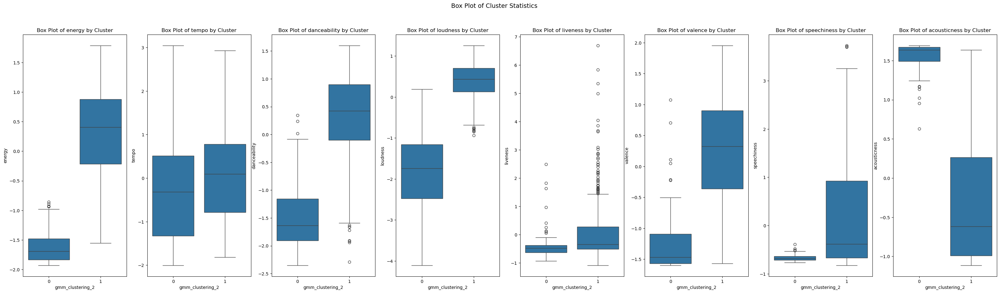

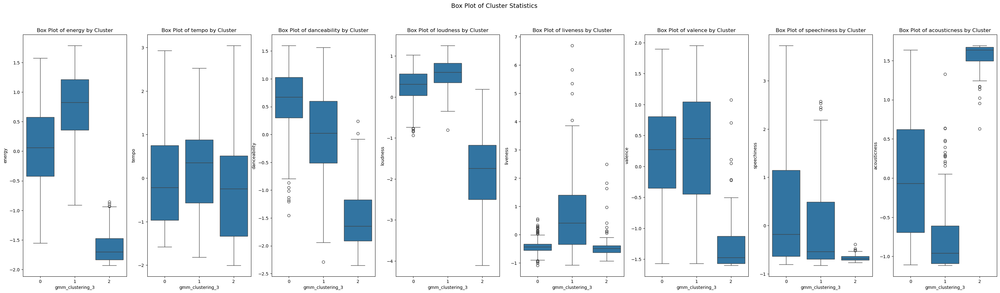

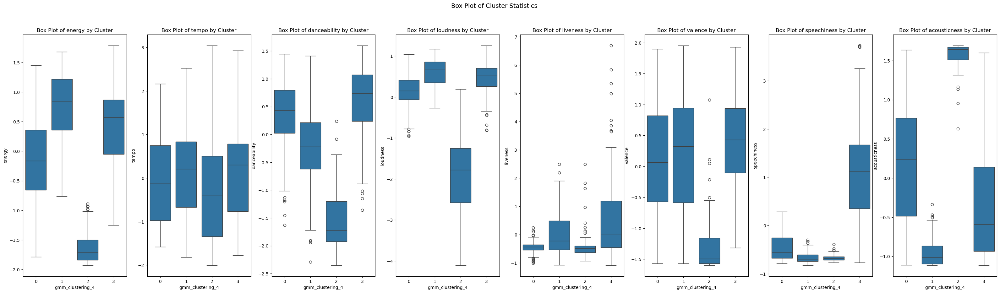

In [ ]:
fig, ax = plt.subplots(1, 8, figsize=(40, 10))
plt.suptitle("Box Plot of Cluster Statistics", fontsize=14)
for i, col in enumerate(cols_num):
    sns.boxplot(x="gmm_clustering_2", y=col, data=df_combo, ax=ax[i])
    ax[i].set_title("Box Plot of %s by Cluster" % (col))
plt.show()

fig, ax = plt.subplots(1, 8, figsize=(40, 10))
plt.suptitle("Box Plot of Cluster Statistics", fontsize=14)
for i, col in enumerate(cols_num):
    sns.boxplot(x="gmm_clustering_3", y=col, data=df_combo, ax=ax[i])
    ax[i].set_title("Box Plot of %s by Cluster" % (col))
plt.show()

fig, ax = plt.subplots(1, 8, figsize=(40, 10))
plt.suptitle("Box Plot of Cluster Statistics", fontsize=14)
for i, col in enumerate(cols_num):
    sns.boxplot(x="gmm_clustering_4", y=col, data=df_combo, ax=ax[i])
    ax[i].set_title("Box Plot of %s by Cluster" % (col))
plt.show()

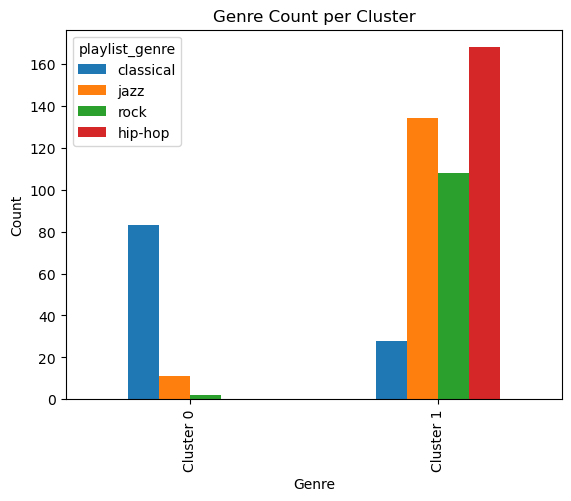

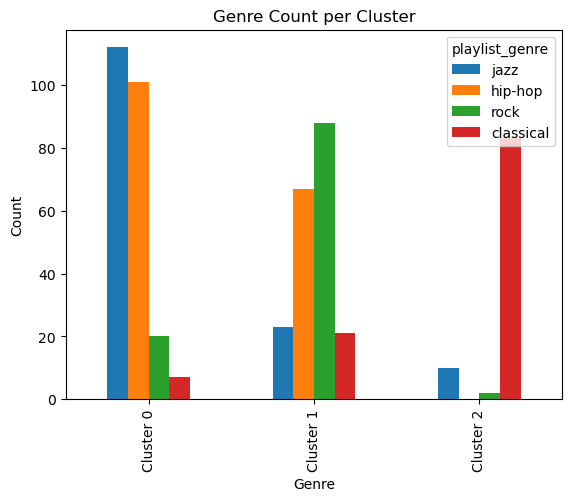

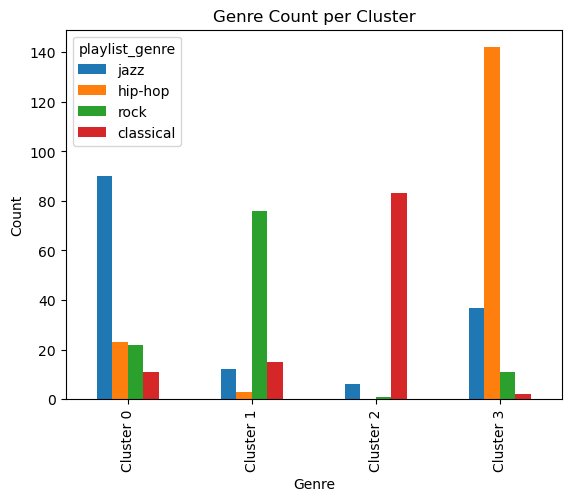

In [ ]:
cluster_0 = df_combo[df_combo['gmm_clustering_2'] == 0]['playlist_genre'].value_counts()
cluster_1 = df_combo[df_combo['gmm_clustering_2'] == 1]['playlist_genre'].value_counts()
final_counts_2 = pd.concat([cluster_0, cluster_1], axis=1).fillna(0)
final_counts_2.columns = ['Cluster 0', 'Cluster 1']

final_counts_2.T.plot(kind='bar')
plt.title('Genre Count per Cluster')
plt.xlabel('Genre')
plt.ylabel('Count')
plt.show()

cluster_0 = df_combo[df_combo["gmm_clustering_3"] == 0]["playlist_genre"].value_counts()
cluster_1 = df_combo[df_combo["gmm_clustering_3"] == 1]["playlist_genre"].value_counts()
cluster_2 = df_combo[df_combo["gmm_clustering_3"] == 2]["playlist_genre"].value_counts()
final_counts_3 = pd.concat([cluster_0, cluster_1, cluster_2], axis=1).fillna(0)
final_counts_3.columns = ["Cluster 0", "Cluster 1", "Cluster 2"]

final_counts_3.T.plot(kind="bar")
plt.title("Genre Count per Cluster")
plt.xlabel("Genre")
plt.ylabel("Count")
plt.show()

cluster_0 = df_combo[df_combo["gmm_clustering_4"] == 0]["playlist_genre"].value_counts()
cluster_1 = df_combo[df_combo["gmm_clustering_4"] == 1]["playlist_genre"].value_counts()
cluster_2 = df_combo[df_combo["gmm_clustering_4"] == 2]["playlist_genre"].value_counts()
cluster_3 = df_combo[df_combo["gmm_clustering_4"] == 3]["playlist_genre"].value_counts()
final_counts_4 = pd.concat([cluster_0, cluster_1, cluster_2, cluster_3], axis=1).fillna(0)
final_counts_4.columns = ["Cluster 0", "Cluster 1", "Cluster 2", "Cluster 3"]

final_counts_4.T.plot(kind="bar")
plt.title("Genre Count per Cluster")
plt.xlabel("Genre")
plt.ylabel("Count")
plt.show()

The dataset contains some outliers. GMM handled these appropriately by assigning lower membership confidence rather than forcing them into a single cluster, which aligns with our goal of preserving meaningful but atypical songs while maintaining the structure of dense clusters. Songs near cluster centers show high membership probabilities while songs in overlapping regions exhibit more distributed memberships, which is consistent with the gradual transitions of music styles and poor separation of clusters observed in the t-SNE plots. This level of fuzziness is desirable for our musical data, where genre and styles are not strictly bounded.


Based on this analysis, we can see that using 4 clusters with GMMs allows us to find 4 clusters each prioritizing its own genre. Furthermore, the clustering with 4 clusters has the strongest corroboration with the t-SNE plots suggested inherent clusters. Based on parameter tuning and visual agreement with t-SNE, the GMM with four clusters provides the strongest evidence of capturing the inherent structure of the dataset. This clustering is informative, aligns with our research motivation, and balances distinct groupings with overlap where audio features naturally blend. The fact that some other genres bleed into other clusters is not surprising given that the original t-SNE plots show some overlap between clusters. This is a reasonable approach for our analysis, as it allows us to see what are the main metrics that define each cluster, as well as understand how different genres are related to each other in terms of their audio features, which can prove useful if we want to recommend similar songs based on the audio features of a given song to maintain a given "vibe" or "style".


Despite these results, each evaluation technique has limitations. AIC and BIC favor simpler Gaussian structures and may underestimate the number of meaningful clusters in highly overlapping musical data. Similarly, the average silhouette score penalizes overlap, meaning the clustering with the highest silhouette may merge distinct but related song groups rather than capture the true underlying structure. Cluster-sorted similarity matrices also do not display perfectly clean block-diagonal form, which reflects gradual transitions in audio features rather than poor clustering performance.


## 9. Clustering Algorithm #2: Hierarchical Agglomerative Clustering (HAC)

First, we color coded our representative t-SNE plot by the cluster labels produced from the clusterings of k = 2, k = 3, ..., k = 9 clusters using HAC Complete linkage and Ward's linkage. In both linkage functions, the plots past k = 3 clusters start to show smaller clusters separated inside bigger clusters.

With that in mind, it is possible that these are subclusters from bigger clusters shown in k = 3 or k = 4 for both linkage functions. The subclusters could represent the songs that have similar vibes, while the bigger clusters are the genres themself. The plot with Ward's linkage seems to indentify the inherent clusters better as the separations of the clusterings match the separations seen in the t-SNE plot.

In [ ]:
# t-SNE Plots
tsne = TSNE(n_components = 2, perplexity = 30, random_state = 128)
data_tsne = tsne.fit_transform(X_num_scaled)
df_tsne = pd.DataFrame(data_tsne, columns = ['x_projected', 'y_projected'])
df_combo = pd.concat([X_num_scaled.reset_index(), df['playlist_genre'].reset_index(), df_tsne], axis = 1)

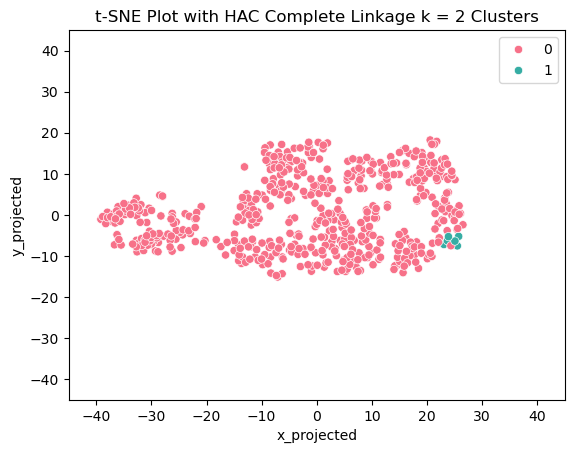

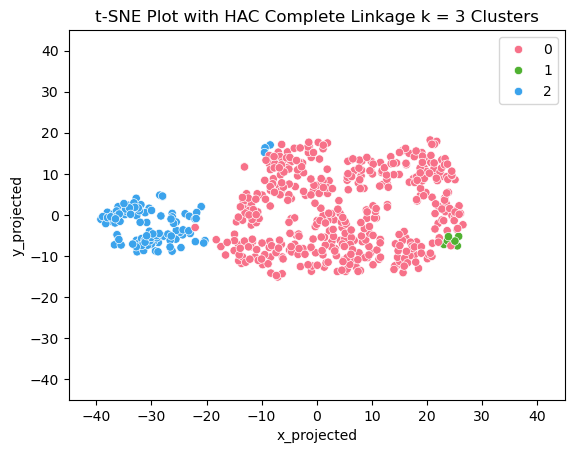

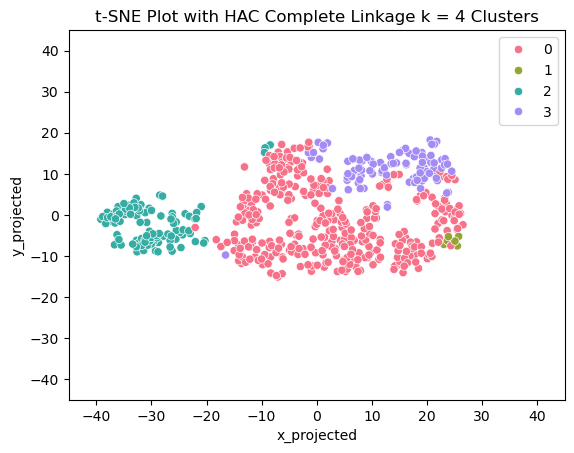

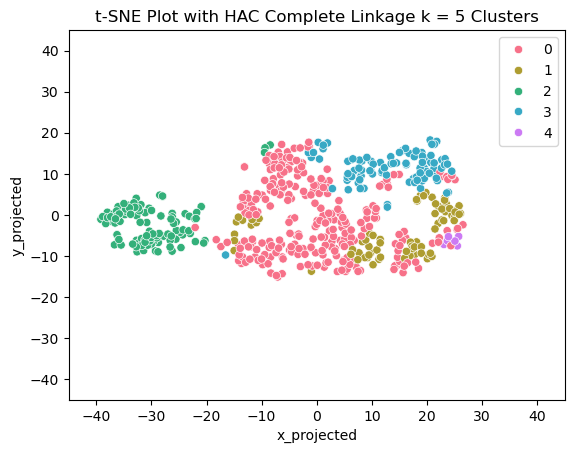

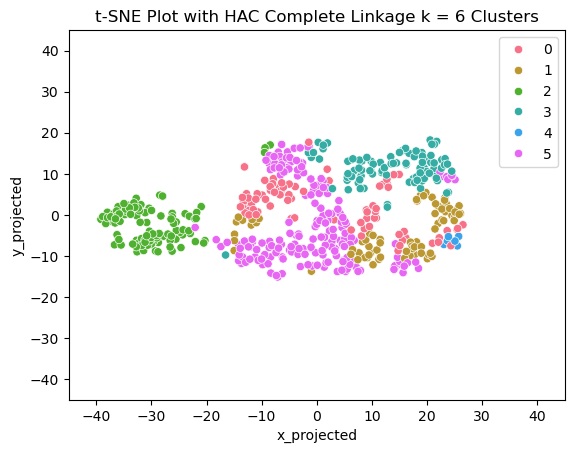

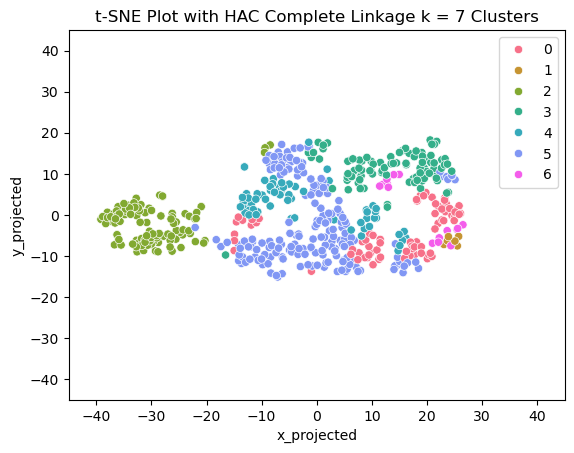

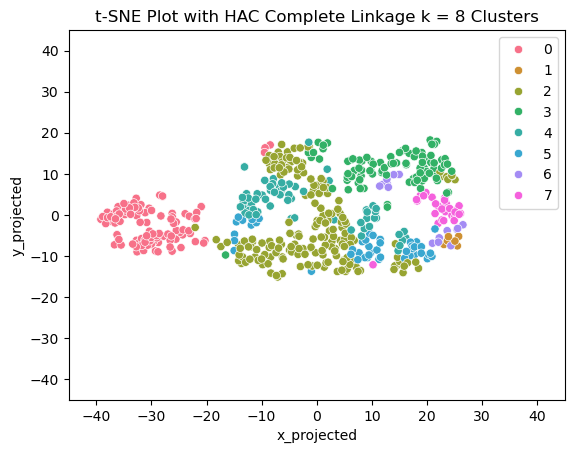

In [ ]:
# HAC with Complete Linkage
for k in range(2, 9):
  hac = AgglomerativeClustering(n_clusters = k, metric = 'euclidean', linkage = 'complete')
  df_combo['predicted_cluster'] = hac.fit_predict(X_num_scaled)

  sns.scatterplot(x = 'x_projected', y = 'y_projected', hue = 'predicted_cluster', palette = sns.color_palette("husl", n_colors = k), data = df_combo)
  plt.title('t-SNE Plot with HAC Complete Linkage k = %s Clusters' %k)
  plt.legend(bbox_to_anchor = (1,1))
  plt.xlim(-45, 45)
  plt.ylim(-45, 45)
  plt.show()

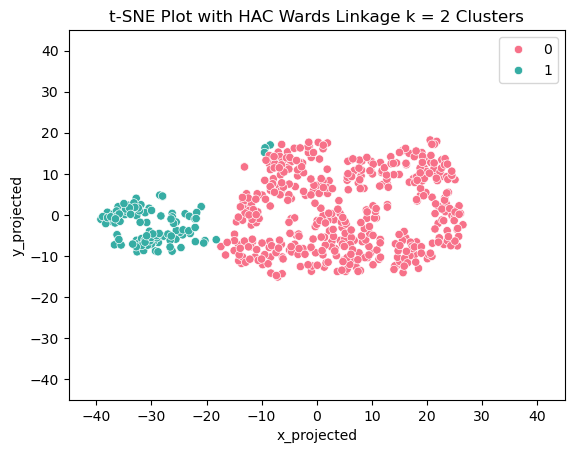

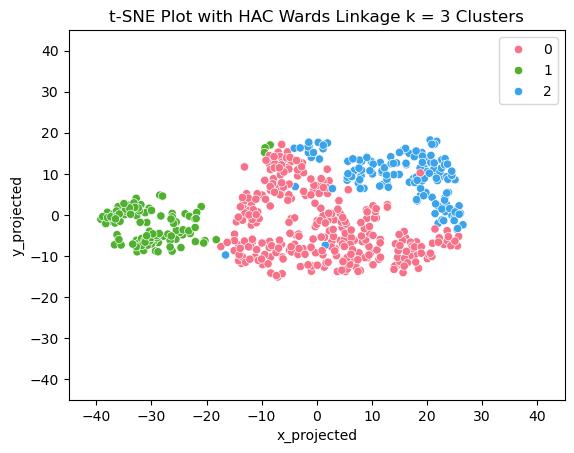

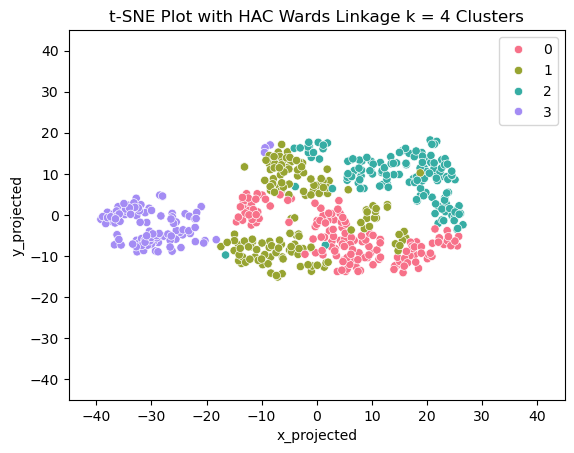

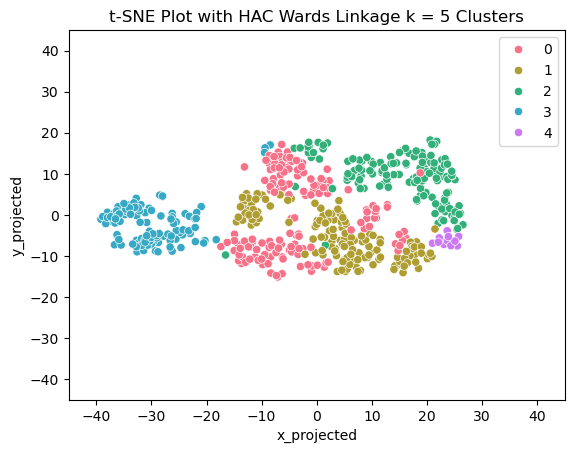

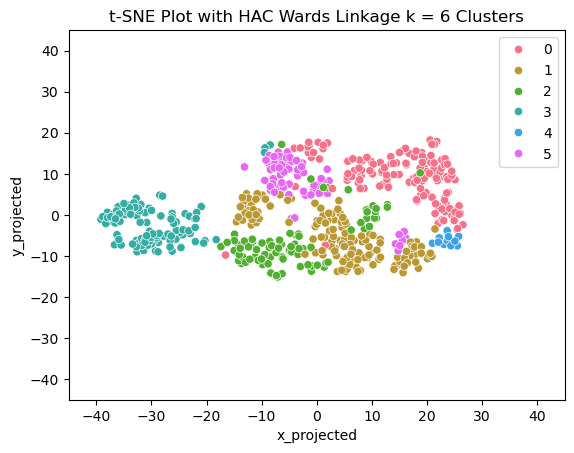

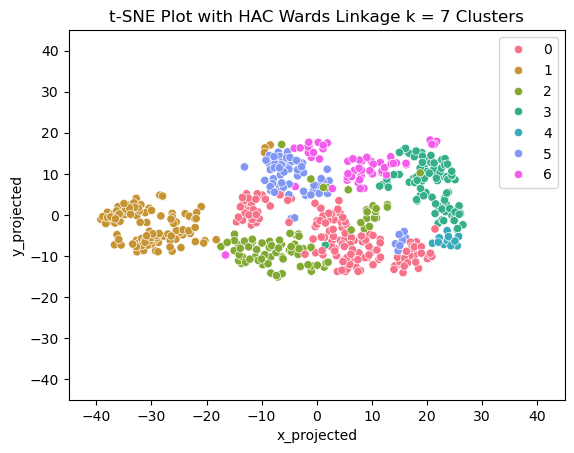

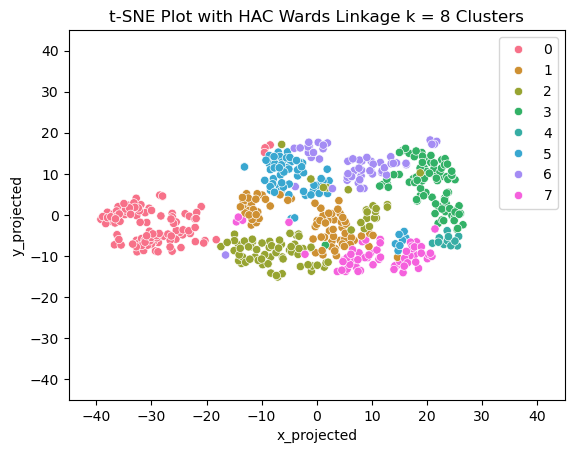

In [ ]:
# HAC with Ward's Linkage
for k in range(2, 9):
  hac = AgglomerativeClustering(n_clusters = k, metric = 'euclidean', linkage = 'ward')
  df_combo['predicted_cluster'] = hac.fit_predict(X_num_scaled)

  sns.scatterplot(x = 'x_projected', y = 'y_projected', hue = 'predicted_cluster', palette = sns.color_palette("husl", n_colors = k), data = df_combo)
  plt.title('t-SNE Plot with HAC Wards Linkage k = %s Clusters' %k)
  plt.legend(bbox_to_anchor = (1, 1))
  plt.xlim(-45, 45)
  plt.ylim(-45, 45)
  plt.show()

Next, we ran average silhouette score plots with k = 2, k = 3, ..., k = 9 clusters to help us find clusterings that could suggest better cohesion and separation than seen in the plots.

The plots suggest that HAC with Complete linkage and k = 2 clusters would yield the best separation and cohesion. Based on our t-SNE plots above, this clustering may not be ideal as it picks out a very small cluster of observations that are not that well separated from other observations near by. This could indicative of a larger inherent cluster being split and that is not ideal for grouping songs based on styles, as it is separating songs in a very niche direction.

The next highest average silhouette score suggest for HAC with Ward's linkage and k = 2 clusters. This clustering may be more in line with the bigger inherent clusters as they are separated where gaps can be seen in the t-SNE plot and it is also a clustering found by the complete linkage function. However, this clustering is a little uneven as it leaves a big cluster on the right, where the t-SNE plot suggest there could be one more split. This clustering could be indicative of a cluster with attributes that could be broad.

Highest Average Silhouette Score for complete Linkage: 0.40203227327042995


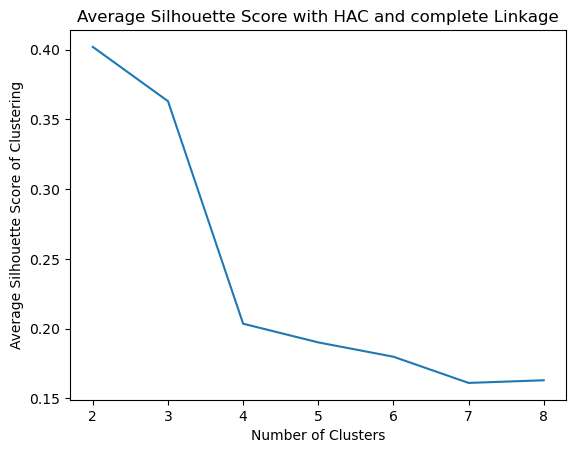

Highest Average Silhouette Score for ward Linkage: 0.3787988504281144


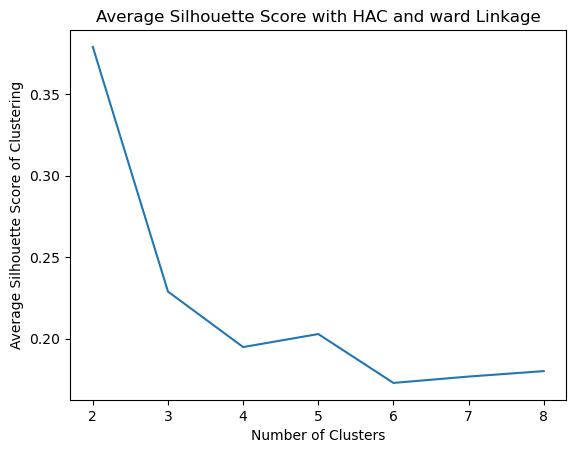

In [ ]:
# Average Silhouette Score Plots
for link in ['complete', 'ward']:
  avg_ss = []
  for k in range(2, 9):
    hac = AgglomerativeClustering(n_clusters = k, metric = 'euclidean', linkage = link)
    Y_pred = hac.fit_predict(X_num_scaled)
    avg_ss.append(silhouette_score(X_num_scaled, Y_pred))

  print('Highest Average Silhouette Score for %s Linkage:' %link, np.max(avg_ss))

  plt.plot(range(2, 9), avg_ss)
  plt.title('Average Silhouette Score with HAC and %s Linkage' %link)
  plt.xlabel('Number of Clusters')
  plt.ylabel('Average Silhouette Score of Clustering')
  plt.show()

Afterwards, we ran Cluster-Sorted Similarity Matrix to better visualize the cohesion and separation of the clusterings from k = 2 to k = 6 clusters. Both linkage function clusterings suggest poor cohesion and separation as the average intra-cluster distance between observations in clusters are alike to the average distance between different clusters. However, this could be a sign that the inherent clusters in the dataset are not going to display in a perfectly diagonal form because from the t-SNE plots we can see that there are some irregular shapes in the clustering found. This may also suggest that there are some overlapping clusters, where observations could have a mix of styles.

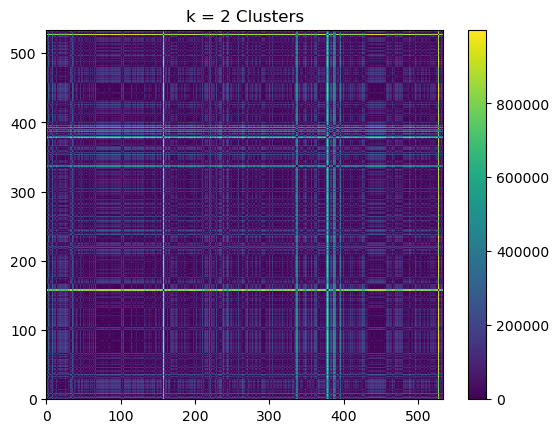

predicted_cluster
0    528
1    534
Name: count, dtype: int64


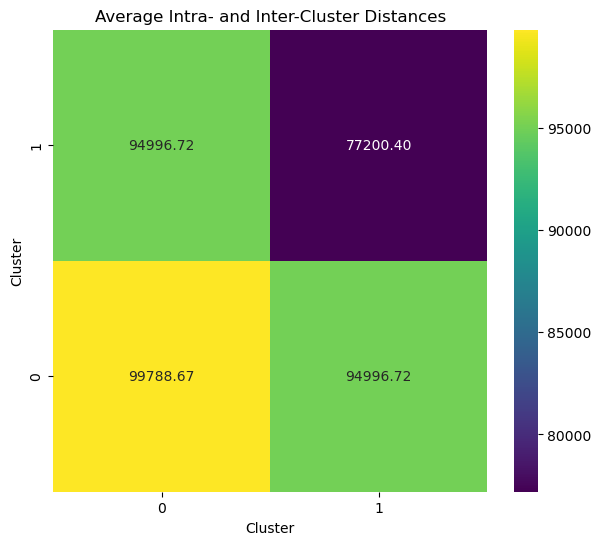

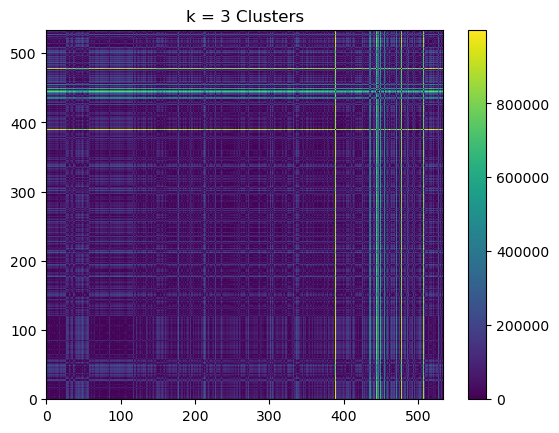

predicted_cluster
0    425
1    431
2    534
Name: count, dtype: int64


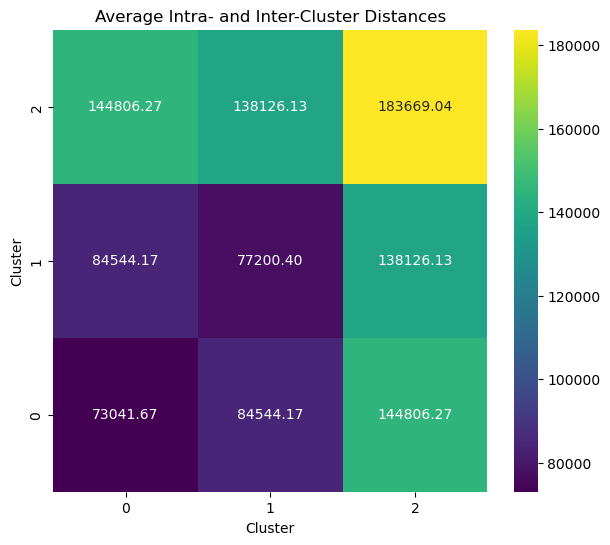

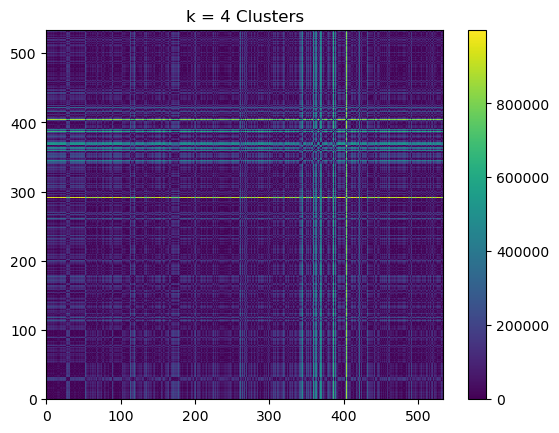

predicted_cluster
0    335
1    341
2    444
3    534
Name: count, dtype: int64


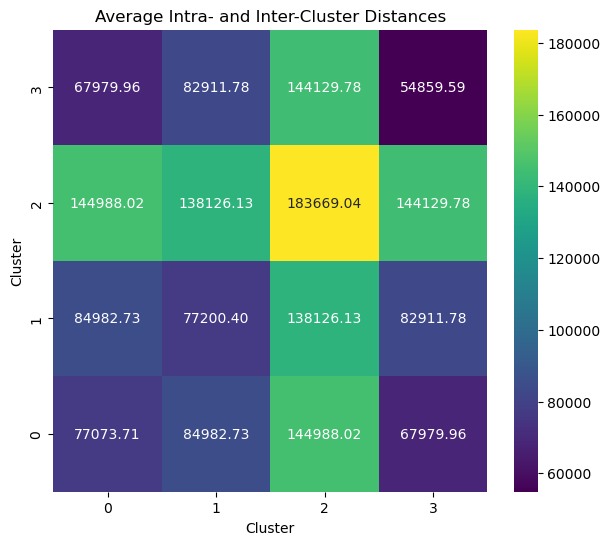

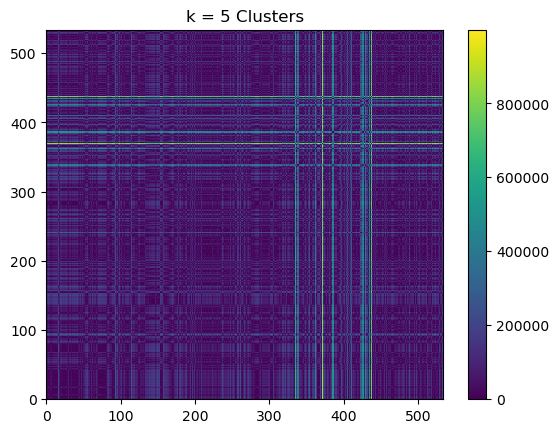

predicted_cluster
0    262
1    335
2    438
3    528
4    534
Name: count, dtype: int64


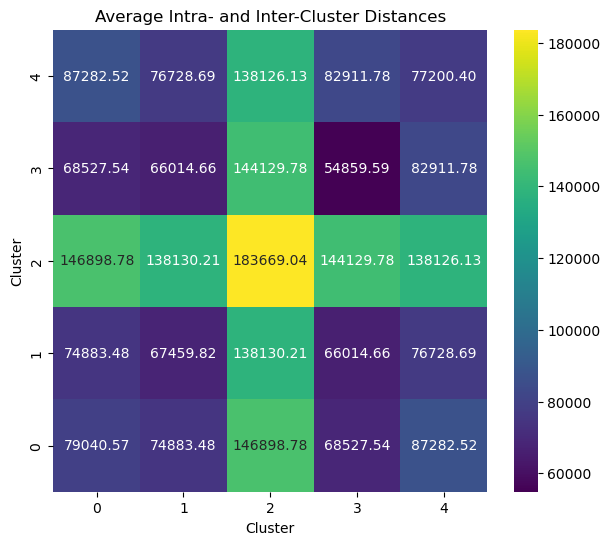

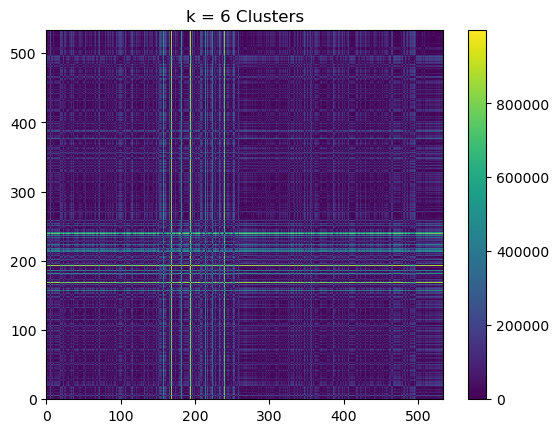

predicted_cluster
0     78
1    151
2    254
3    344
4    350
5    534
Name: count, dtype: int64


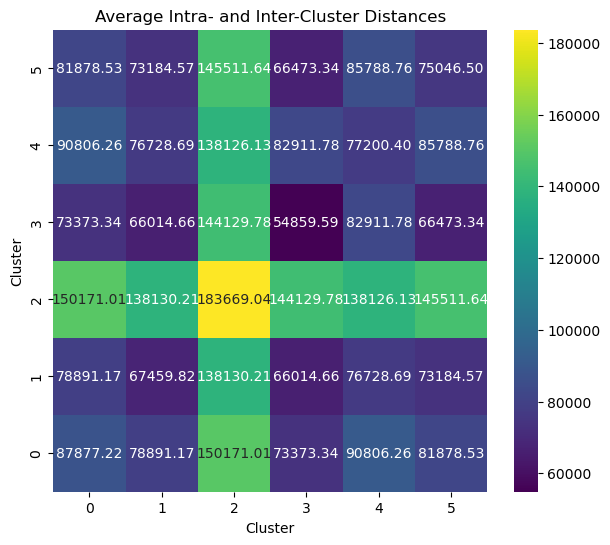

In [ ]:
# Complete Linkage Cluster-Sorted Similarity Matrix
for k in range(2, 7):
  hac = AgglomerativeClustering(n_clusters = k, metric = 'euclidean', linkage = 'complete')
  df['predicted_cluster'] = hac.fit_predict(X_num_scaled)

  df_sort = df.sort_values(by=['predicted_cluster'])
  df_sort = df_sort.drop(['predicted_cluster', 'time_signature', 'playlist_genre', 'playlist_name',
                            'key', 'mode', 'track_album_name', 'track_id', 'playlist_id', 'track_album_id', 'id', 'analysis_url',
                            'track_album_release_date', 'type', 'uri', 'track_name', 'track_href', 'playlist_subgenre', 'track_artist'], axis = 1)

  dist_mat = squareform(pdist(df_sort))

  plt.pcolormesh(dist_mat)
  plt.colorbar()
  N = len(df_sort)
  plt.title('k = %s Clusters' %k)
  plt.xlim([0,N])
  plt.ylim([0,N])
  plt.show()

  end_points = df['predicted_cluster'].value_counts().sort_index().cumsum()
  print(end_points)

  avg_dist_mat = np.zeros((len(end_points), len(end_points)))
  for i in range(0, len(end_points)):
    for j in range(0, len(end_points)):
      start_i = 0 if i == 0 else end_points[i - 1]
      start_j = 0 if j == 0 else end_points[j - 1]
      end_i = end_points[i]
      end_j = end_points[j]

      block = dist_mat[start_i:end_i, start_j:end_j]
      avg_dist_mat[i, j] = block.mean()

  avg_dist_df = pd.DataFrame(avg_dist_mat, index = range(0, len(end_points)), columns = range(0, len(end_points)))
  avg_dist_df_flipped = avg_dist_df.iloc[::-1]
  plt.figure(figsize = (7,6))
  sns.heatmap(avg_dist_df_flipped, annot = True, fmt=".2f", cmap = 'viridis')
  plt.title("Average Intra- and Inter-Cluster Distances")
  plt.ylabel("Cluster")
  plt.xlabel("Cluster")
  plt.show()

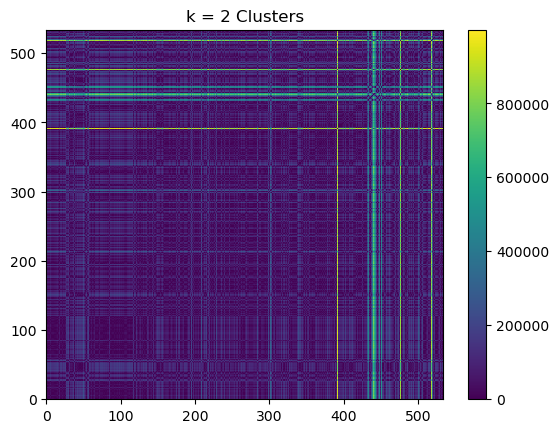

predicted_cluster
0    429
1    534
Name: count, dtype: int64


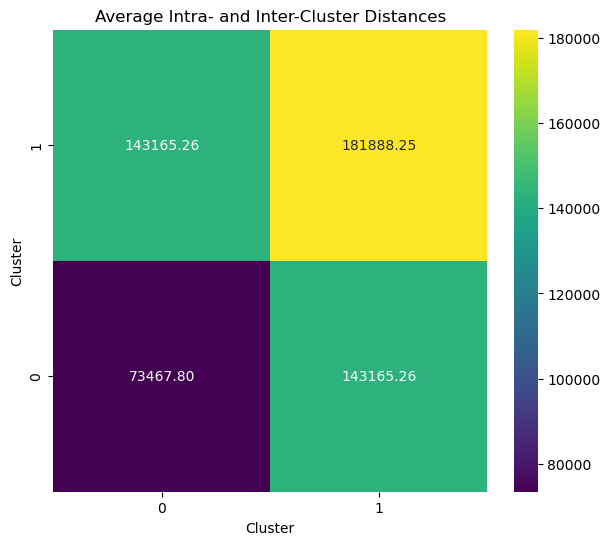

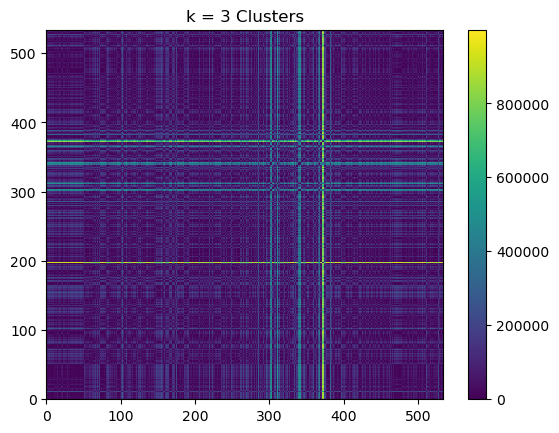

predicted_cluster
0    292
1    397
2    534
Name: count, dtype: int64


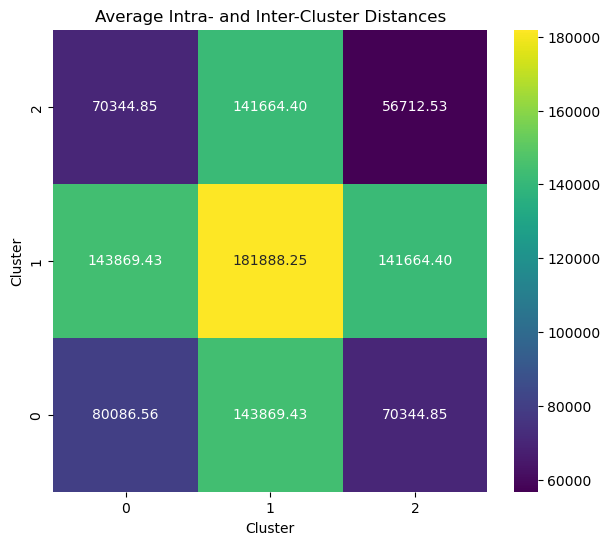

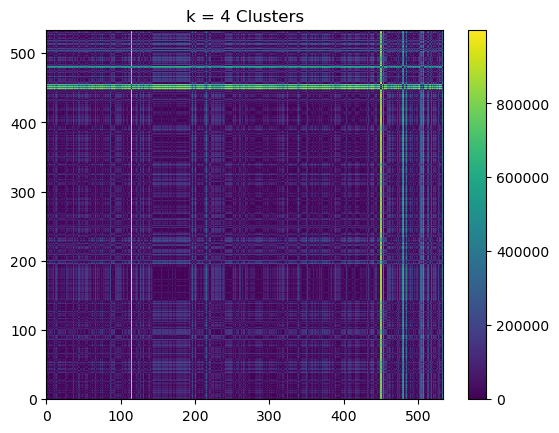

predicted_cluster
0    144
1    292
2    429
3    534
Name: count, dtype: int64


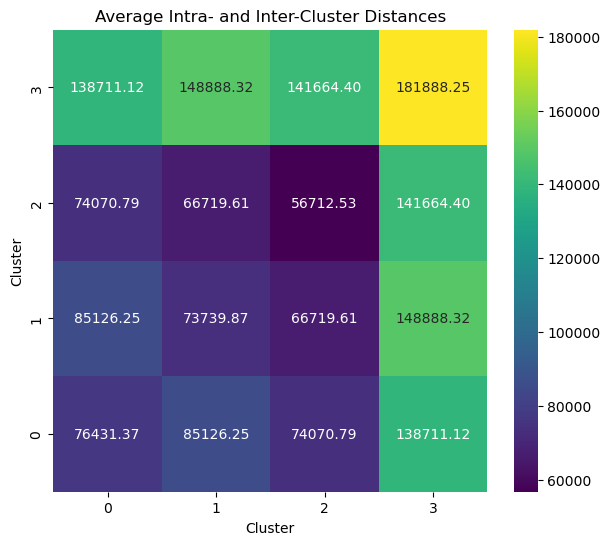

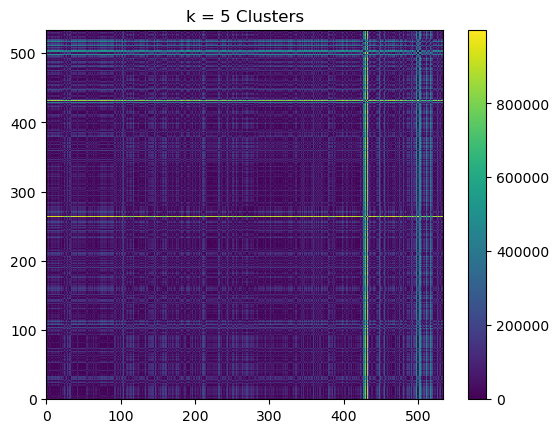

predicted_cluster
0    148
1    281
2    418
3    523
4    534
Name: count, dtype: int64


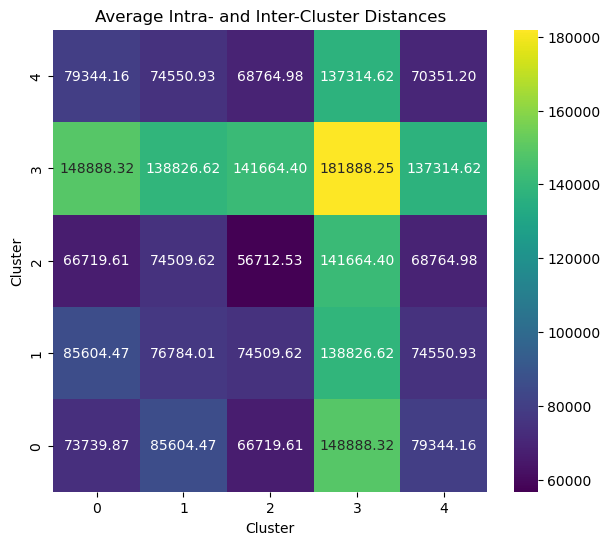

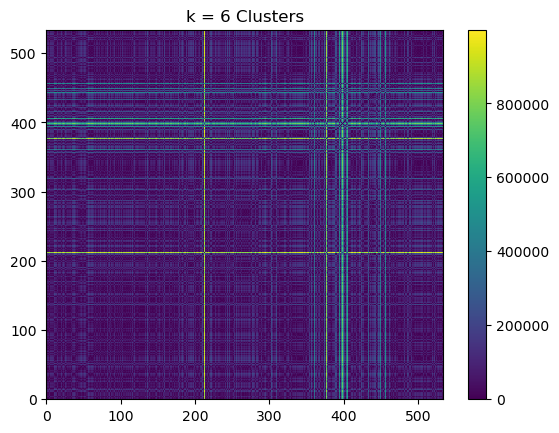

predicted_cluster
0    137
1    270
2    353
3    458
4    469
5    534
Name: count, dtype: int64


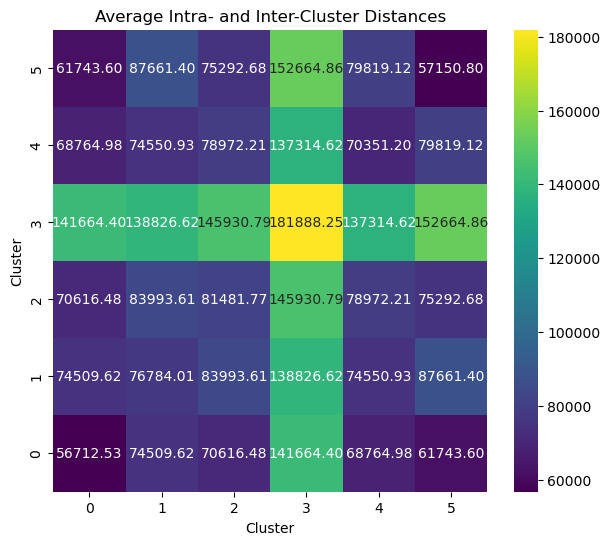

In [ ]:
# Ward's Linkage Cluster-Sorted Similarity Matrix
for k in range(2,7):
  hac = AgglomerativeClustering(n_clusters = k, metric = 'euclidean', linkage = 'ward')
  df['predicted_cluster'] = hac.fit_predict(X_num_scaled)

  df_sort = df.sort_values(by=['predicted_cluster'])
  df_sort = df_sort.drop(['predicted_cluster', 'time_signature', 'playlist_genre', 'playlist_name',
                            'key', 'mode', 'track_album_name', 'track_id', 'playlist_id', 'track_album_id', 'id', 'analysis_url',
                            'track_album_release_date', 'type', 'uri', 'track_name', 'track_href', 'playlist_subgenre', 'track_artist'], axis = 1)

  dist_mat = squareform(pdist(df_sort))

  plt.pcolormesh(dist_mat)
  plt.colorbar()
  N = len(df_sort)
  plt.title("k = %s Clusters" %k)
  plt.xlim([0,N])
  plt.ylim([0,N])
  plt.show()

  end_points = df['predicted_cluster'].value_counts().sort_index().cumsum()
  print(end_points)

  avg_dist_mat = np.zeros((len(end_points), len(end_points)))
  for i in range(0, len(end_points)):
    for j in range(0, len(end_points)):
      start_i = 0 if i == 0 else end_points[i - 1]
      start_j = 0 if j == 0 else end_points[j - 1]
      end_i = end_points[i]
      end_j = end_points[j]

      block = dist_mat[start_i:end_i, start_j:end_j]
      avg_dist_mat[i, j] = block.mean()

  avg_dist_df = pd.DataFrame(avg_dist_mat, index = range(0, len(end_points)), columns = range(0, len(end_points)))
  avg_dist_df_flipped = avg_dist_df.iloc[::-1]
  plt.figure(figsize = (7,6))
  sns.heatmap(avg_dist_df_flipped, annot = True, fmt=".2f", cmap = 'viridis')
  plt.title("Average Intra- and Inter-Cluster Distances")
  plt.ylabel("Cluster")
  plt.xlabel("Cluster")
  plt.show()

Considering the small subcluster of observations on the bottom right that appeared in both Complete and Ward's linkage. Pre-labeling the t-SNE plots, these observations are not shown to be that well separated from other observations in the t-SNE plot, meaning they could be part of a larger cluster. In that regard, HAC Ward's linkage seems to have handled these observations better as it only clustered these observations together after identifying four main clusters, while Complete linkage began with that set of observations.

However, both clusterings handle these observations well if we want to find smaller clusterings based on niche styles. It could be the case that those small set of observations have a more distinct style than the other songs.

The techniques used to assess the cohesion and separation of clusterings were Average Silhouette Score plots and Cluster-Sorted Similarity matrices. They had some shortcomings to them as there is some evidence their suggestions don't align with what inherent clusters there may be in the dataset. The highest average silhouette score was for HAC with Complete linkage and k = 2 clusters. This clustering contained a small grouping of observations together in one cluster, and when considering the t-SNE plots with colored labels, it is a grouping that could be part of larger clusters when considering the separation in the plots. In a similar fashion, the cluster-sorted similarity matrices suggested that various clusterings had poor cohesion and separation, but the t-SNE plots create some evidence of good separation between at least some clusterings. Although they didn't succeed in finding clusterings that match the inherent clusters, they provided some information that the inherent clusters may have odd shapes or subclusters in them.

Overall, the clustering that seems to showcase the most information best is HAC with Ward's linkage and k = 4 clusters. This clustering is composed of clusters that follow the separation seen in the t-SNE plots, suggesting they could be along the lines of the inherent clusters. In addition, there are several overlapping observations that would explain the low cohesion and separation seen in the techniques above.

This meaning of these clusters could be the four big styles found in the songs and the overlapping observations could be songs with traits that fit into multiple styles. There are also some suggestion of sub-clusters, these could be more specific styles.

The dendrogram with genre labels also aids in these interpretations as the classical genre is largely it's own cluster and while jazz in generally grouped with hip-hop and rock, there are some observations of jazz and classical genre together. This could be a subcluster of a style that has some traits that are in those jazz and classical songs, but not in other typical classical or jazz songs.

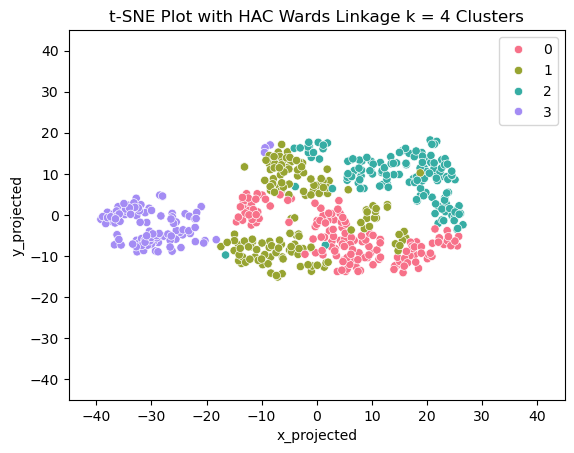

In [ ]:
# HAC with Ward's Linkage and k = 4 Clusters
hac = AgglomerativeClustering(n_clusters = 4, metric = 'euclidean', linkage = 'ward')
df_combo['predicted_cluster'] = hac.fit_predict(X_num_scaled)

sns.scatterplot(x = 'x_projected', y = 'y_projected', hue = 'predicted_cluster', palette = sns.color_palette("husl", n_colors = 4), data = df_combo)
plt.title('t-SNE Plot with HAC Wards Linkage k = 4 Clusters')
plt.legend(bbox_to_anchor = (1, 1))
plt.xlim(-45, 45)
plt.ylim(-45, 45)
plt.show()

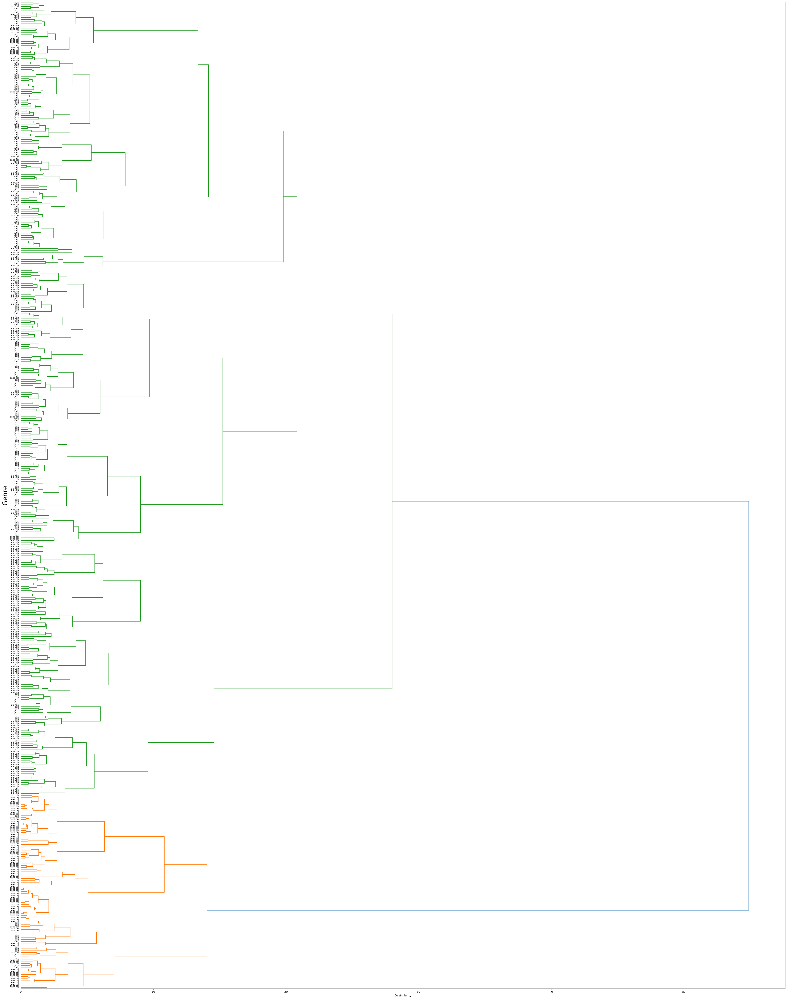

In [ ]:
# HAC with Ward's Dendrogram
dm = pdist(X_num_scaled, metric = 'euclidean')
Z = linkage(dm, method = 'ward')

fig, ax = plt.subplots(figsize = (50, 65))
d = dendrogram(Z, orientation = 'right', labels = df['playlist_genre'].array, ax = ax)
ax.set_xlabel('Dissimilarity')
ax.set_ylabel('Genre', fontsize = 24)
plt.yticks(fontsize = 8)
plt.show()

## 10. Discussion

In [ ]:
# best GMM labels
best_gmm = gm_4
best_gmm_labels = np.argmax(best_gmm.predict_proba(X_num_scaled), axis = 1)

# best HAC labels
best_hac = hac
best_hac_labels = best_hac.fit_predict(X_num_scaled)

# compute adjusted rand score
ari_score = adjusted_rand_score(best_gmm_labels, best_hac_labels)
print(ari_score)

0.5295316434377497


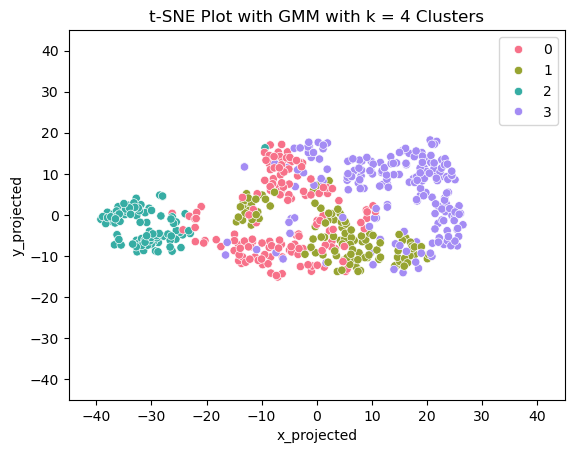

In [ ]:
df_combo['predicted_cluster'] = best_gmm_labels
sns.scatterplot(x = 'x_projected', y = 'y_projected', hue = 'predicted_cluster', palette = sns.color_palette("husl", n_colors = 4), data = df_combo)
plt.title('t-SNE Plot with GMM with k = 4 Clusters')
plt.legend(bbox_to_anchor = (1, 1))
plt.xlim(-45, 45)
plt.ylim(-45, 45)
plt.show()


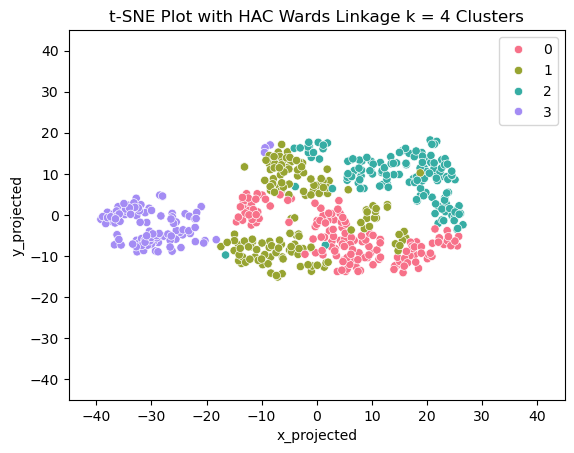

In [ ]:

df_combo['predicted_cluster'] = best_hac_labels
sns.scatterplot(x = 'x_projected', y = 'y_projected', hue = 'predicted_cluster', palette = sns.color_palette("husl", n_colors = 4), data = df_combo)
plt.title('t-SNE Plot with HAC Wards Linkage k = 4 Clusters')
plt.legend(bbox_to_anchor = (1, 1))
plt.xlim(-45, 45)
plt.ylim(-45, 45)
plt.show()

The "best" results from the two clustering algorithms are GMM and HAC Ward's linkage, both with 4 clusters and they share some similarities and some differences. The adjusted rand score between the two clusterings is approximately $0.5295$, indicating moderate agreement. The clusterings capture some of the same structure but also differ for a substantial subset of observations.

Examining the t-SNE plots color-coded by cluster labels highlights were the differences occur. In general, both clusterings identify the broad structure of the dataset, separating major genres and style groups. Comparing the cluster labeled t-SNE plots, the leftmost and rightmost clusters are generally very similar and identified by both clusterings. Where they differ is in the overlapping regions in the middle that have poor separation. The biggest difference was in between how many observations were included in the middle-right bottom cluster. These inherent clusters were clustered slightly differently between the two algorithms.

Out of all the clusterings explored from both algorithms, the GMM with 4 clusters provided the strongest evidence of capturing the inherent structure of the dataset. This clustering effectively identifies the four main groupings of songs while handling overlapping or atypical song styles through probabilistic membership.

Compared to HAC, GMM also offers more nuanced information about songs that lie near cluster boundaries, reflecting the gradual transitions between musical styles. The t-SNE plots corroborate that GMM clusters align well with the inherent groupings suggested by the data, and the fuzzy assignments allow us to see which songs exhibit traits of multiple clusters. Overall, GMM with 4 clusters balances distinct cluster identification with flexibility in areas of poor separation, making it the best clustering for understanding music based on audio features and also aligns very closely with a song's genre.

The GMM provided insights that HAC did not capture. Specifically, GMM's probabilistic membership reveals which songs lie near cluster boundaries highlighting overlapping/transitional music styles. This allowed us to see songs that may share traits with multiple clusters.

On the other hand, the HAC reveals some hierarchical relationships that the GMM does not explicitly show. The dendrogram demonstrates potential subclusters within broader clusters. For instance, among the four clusters, three are closer together than one, and within that cluster, approximately half of observations are further away from the other half. This is useful for understanding the nested structure in the dataset.


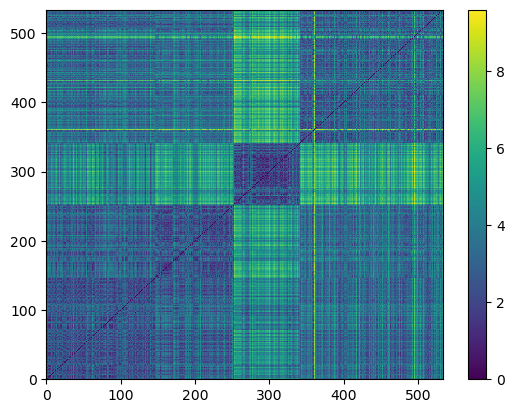

gmm_predicted_cssm
0    146
1    252
2    342
3    534
Name: count, dtype: int64


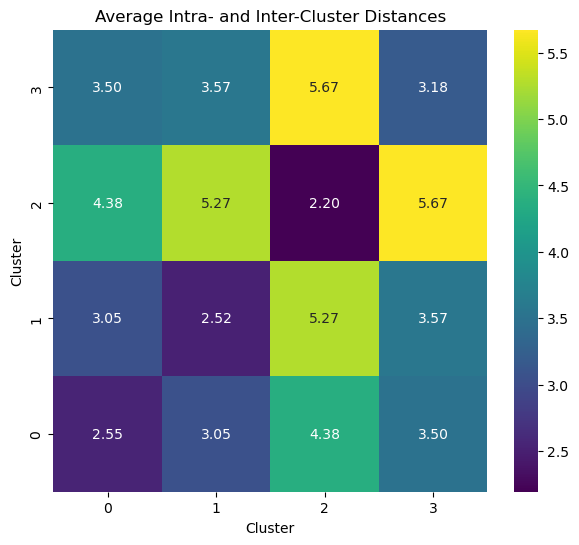

In [ ]:
X['gmm_predicted_cssm'] = best_gmm_labels

X_sorted = X.sort_values(by = ["gmm_predicted_cssm"]).reset_index(drop = True)

dist_mat = squareform(pdist(X_sorted[cols_num], metric = "euclidean"))

plt.pcolormesh(dist_mat)
plt.colorbar()
N = len(X_sorted)
plt.xlim([0, N])
plt.ylim([0, N])
plt.show()

end_points = X["gmm_predicted_cssm"].value_counts().sort_index().cumsum()

print(end_points)
avg_dist_mat = np.zeros((len(end_points), len(end_points)))
for i in range(0, len(end_points)):
    for j in range(0, len(end_points)):
        start_i = 0 if i == 0 else end_points[i - 1]
        start_j = 0 if j == 0 else end_points[j - 1]
        end_i = end_points[i]
        end_j = end_points[j]

        block = dist_mat[start_i:end_i, start_j:end_j]
        avg_dist_mat[i, j] = block.mean()

avg_dist_df = pd.DataFrame(
    avg_dist_mat, index=range(0, len(end_points)), columns=range(0, len(end_points))
)
avg_dist_df_flipped = avg_dist_df.iloc[::-1]
plt.figure(figsize=(7, 6))
sns.heatmap(avg_dist_df_flipped, annot=True, fmt=".2f", cmap="viridis")
plt.title("Average Intra- and Inter-Cluster Distances")
plt.ylabel("Cluster")
plt.xlabel("Cluster")
plt.show()

One cluster stands out as being further away from the others, which likely corresponds to the leftmost cluster seen in the t-SNE plots. The remaining three clusters are closer to one another, with the bottom left two clusters in the similarity matrix showing the poorest separation. This makes sense given the poor separation we see in the t-SNE plots.

Overall, the clusters are relatively dense. The cluster with the greatest separation also has the highest density, while the three other clusters are slightly less dense, but still cohesive. This reflects a reasonably cohesive grouping of songs within each cluster.

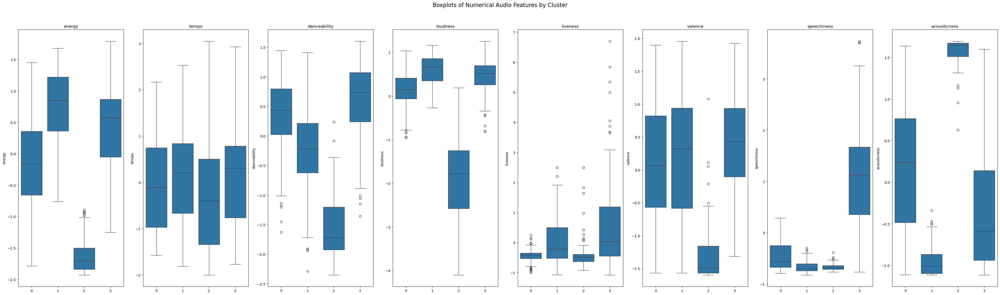

In [ ]:
df_combo['gmm_clustering'] = best_gmm_labels

fig, axes = plt.subplots(1, len(cols_num), figsize = (40, 12))
plt.suptitle("Boxplots of Numerical Audio Features by Cluster", fontsize = 16)
for i, col in enumerate(cols_num):
    sns.boxplot(x = 'gmm_clustering', y = col, data = df_combo, ax = axes[i])
    axes[i].set_title(col)
    axes[i].set_ylabel(col)
    axes[i].set_xlabel('')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

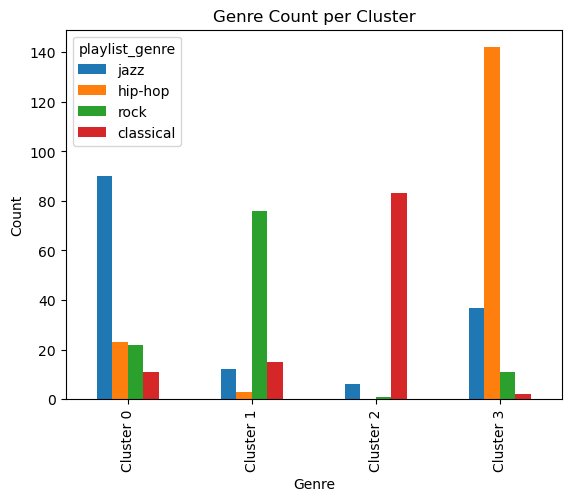

In [ ]:
cluster_0 = df_combo[df_combo["gmm_clustering"] == 0]["playlist_genre"].value_counts()
cluster_1 = df_combo[df_combo["gmm_clustering"] == 1]["playlist_genre"].value_counts()
cluster_2 = df_combo[df_combo["gmm_clustering"] == 2]["playlist_genre"].value_counts()
cluster_3 = df_combo[df_combo["gmm_clustering"] == 3]["playlist_genre"].value_counts()
final_counts_4 = pd.concat([cluster_0, cluster_1, cluster_2, cluster_3], axis = 1)
final_counts_4.columns = ["Cluster 0", "Cluster 1", "Cluster 2", "Cluster 3"]

final_counts_4.T.plot(kind = "bar")
plt.title("Genre Count per Cluster")
plt.xlabel("Genre")
plt.ylabel("Count")
plt.show()

The GMM clustering identified four distinct clusters in the audio features dataset. Through an analysis of numerical audio features and the categorical genre distributions, each cluster demonstrates unique musical characteristics. Something to note is that the tempo span for all clusters is very large and has minimal differences among the clusters.

Cluster 0: Jazz dominant

From the barplot of genre labels, we can see this cluster is clearly dominated by jazz songs. There are approximately 90 jazz tracks, 20 hip-hop, 20 rock, and 10 classical songs in this cluster.

Audio characteristics:
* Energy: Energy is slightly lower with a median around -0.3. This cluster's energy range practically spans the entirety of the energy range, but its IQR is lower than two others, indicating somewhat calmer less intense musical content.
* Danceability: The danceability has a median around 0.45. This is the second highest danceability among the clusters, although all the clusters danceability span a large range.
* Loudness: This cluster has a positive loudness but lower than clusters 1 and 3.
* Liveness: This cluster has one of the lowest liveness scores, and the lowest liveness score range, suggesting songs not common for large live audiences.
* Valence: Moderate valence, suggesting neutral to slightly negative emotional character, as expected from a cluster dominated by jazz songs.
* Speechiness: This cluster has the second highest speechiness, but still is much lower than the highest.
* Acousticness: This grouping has a huge acousticness range with a median of approximately 0.025, indicating a mix of electronic and acoustic elements.

Thus, this cluster represents traditional jazz music characterized by moderate energy levels, a balance between instrumental and vocal elements, and diverse emotional tones.


Cluster 1: Rock dominant

From the barplot of genre labels, we can see this cluster is clearly dominated by rock songs. There are approximately 80 rocks songs, 10 jazz songs, 15 classical songs, and only a few hip-hop songs in this cluster.

Audio characteristics:
* Energy: This cluster has the highest energy with a median around 0.8. Rock songs typically have high energy.
* Danceability: This cluster has low danceability with a median of approximately -0.2.
* Loudness: The highest loudness cluster is this one, with an approximate median of 0.7.
* Liveness: The second highest liveness score. Suggests more audience presence than clusters 0 and 2.
* Valence: Generally unnoteworthy valence score for this cluster. A positive near zero median for valence with a large range suggests a wide range of songs sounding happy and sad.
* Speechiness: One of the lowest speechiness scores. Suggest some vocal content but not speech heavy.
* Acousticness: This cluster has by far the lowest acousticness. More than any other, this cluster has tracks with some vocal content in it.

This cluster captures rock music with its characteristic high energy and intensity, and very low acousticness and loud production, but low danceability.

Cluster 2: Classical dominant

From the barplot of genre labels, we can see this cluster is clearly dominated by classical songs. There are roughly 80 classical songs, 10 jazz songs, and almost no hip-hop or rock songs in this cluster.

Audio characteristics:
* Energy: This cluster has by far the lowest energy. The other clusters all have similar high energy meanwhile this cluster has a significantly lower energy score with a median of approximately -1.75.
* Danceability: This cluster also has by far the lowest danceability score. It has a very low median score at approximately -1.75.
* Loudness: This cluster has the most quiet overall production with the greatest dynamic range. The loudness median for this cluster is also approximately -1.75, much quieter than all the other clusters.
* Liveness: Similarly, there is a near zero audience presence with an extremely low liveness score.
* Valence: This cluster has the lowest valence with a median near -1.5. This cluster is characterized by serious, and emotional character.
* Speechiness: This cluster has very minimal speechiness with virtually no spoken words.
* Acousticness: The low speechiness is seen here with by far the highest acousticness score with a median of approximately 1.7. There is a very high likelihood of instrumental only tracks with no vocals.

This cluster clearly isolates classical orchestra music with a distinctive combination of quiet, low energy, instrumental only tracks with a lack of dance-oriented features.

Cluster 3: Hip-Hop dominant

From the barplot of genre labels, we can see this cluster is clearly dominated by hip-hop songs. There are approximately 140 hip-hop songs, 40 jazz songs, 10 rock songs, and only a couple classical songs in this cluster.

Audio characteristics:
* Energy: This cluster has high energy with a median around 0.7 as we would expect from most hip-hop songs.
* Danceability: This cluster consists of songs with the highest danceability. While all clusters danceability ranges are large, this cluster has a median around 0.7.
* Loudness: This cluster is one of the loudest clusters, typical of hip-hop.
* Liveness: This cluster has a median liveness of roughly 0. this is the highest among the clusters and has some noteworthy extreme outliers with a absurdly high liveness score of 7.
* Valence: This cluster has a fairly standard valence amongst the cluster with a large range of emotions, but more generally positive with a median valence score greater than 0.
* Speechiness: This cluster is characterized by a very large speechiness score. The other 3 clusters speechiness scores are very low whereas this cluster has a median speechiness of about 1 and a very large range.
* Acousticness: On the same idea, this cluster has the second lowest acousticness scores. It has a median acousticness of approximately -0.6.

Thus, this cluster represents hip-hop and dance orientated music characterized by higher energy, high danceability, and very speechy songs.



## 11. Conclusion

Summary

In this report, we applied two clustering algorithms, GMM and HAC, to explore the structure of a music audio features dataset. We evaluated clustering results using t-SNE visualziations, and metrics such as cluster-sorted similarity matrices, and average silhouette scores. While HAC provided insights into hierarchical structures, the GMM with four clusters emerged as the most informative and helped us identify the following meaningful groupings:

* Moderate energy leels, balanced instrumental and vocal elements with diverse emotional tones dominated by jazz
* High energy, intensity and loudness, with very low acousticness danceability dominated by rock
* Low energy, quiet, instrumental only tracks with low danceability dominated by classical
* Higher energy, high danceability, and very speechy songs dominated by hip-hop

Our cluster analysis revealed these unique audio and feature profiles for each genre dominated cluster.

Recommendation

The clustering insights, particularly from the four cluster GMM, can be applied to music recommendation systems and playlist curation. GMM's probabilistic membership scores allow songs to belong to multiple clusters, enabling recommendations that match a listener's preffered vibe or style rather than just genre. Playlists could be curated using cluster-specific audio profiles, while songs near cluster boundaries could support cross-genre or exploratory recommendations. These insights can help organize music catalogs to improve recommendations.

Shortcomings/Caveats

This analysis has several limitations. We used only four genres, rock, jazz, classical, and hip-hop. Furthermore, only nine numerical audio features were used. There are plenty of other numerical audio features that could be created based on the songs information. We also left out potentially informative metadata such as lyrics and artist. Additionally, the dataset represents only a small subset of all available songs, limiting how broadly are results can be used. The clusters are also not perfectly separated, reflecting overlap and fuzziness in musical styles, which could reduce predictive accuracy for highly specific recommendations.




Future Work

Future work could expand the dataset to include more genres and a larger variety of songs to improve how general our results are. Additional features such as lyrics or artist information could be incorporated to refine clustering and better capture musical relationships. Exploring hybrid approaches may help resolve overlapping clusters and improve separation. Finally integrating these clusters into a recommendation system and evaluating user engagement or satisfaction could validate utility of the clusters.

## References

Schedl, M., Zamani, H., Chen, C.-W., Deldjoo, Y., & Elahi, M. (2018). Current challenges and visions in music recommender systems research. International Journal of Multimedia Information Retrieval, 7(2), 95–116. https://doi.org/10.1007/s13735-018-0154-2.